In [1]:
import pandas as pd
import numpy as np
from dotenv import load_dotenv
import os
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
import plotly.graph_objects as go
import plotly.express as px
from ipywidgets import interact, widgets
from IPython.display import display, clear_output
from prophet import Prophet


In [2]:
from xgboost import XGBRegressor


In [32]:
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error, mean_squared_log_error
import ta  # Technical Analysis library
from keras.models import Sequential
from keras.layers import Dense, LSTM
# Load environment variables
_ = load_dotenv()

# Configuration to suppress warnings
warnings.filterwarnings('ignore')

In [4]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

In [5]:
# Additional configurations for better control over visualizations (optional)
plt.style.use('ggplot')  # For ggplot-like style in plots
pd.options.display.max_columns = None  # Ensure all columns are visible when displaying DataFrames


## Loading the Dataset

In [6]:
# Define the path to the dataset
file_path = '/Users/aryasmc/My_USD/Year_2024/Summer_2024/Capstone_Project/Capstone_Project/Cleaned_Data/cleaned_crypto_updated_722.csv'

# Load the dataset
df = pd.read_csv(file_path)
df.head(2)

,time,product_id,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
0,2021-07-16,ADA-USD,1.1661,1.2452,1.2249,1.1714,3.676491e+07,-0.0535,1.20565,6.783295,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.1714,1.1714,1.1714,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-07-16,COMP-USD,367.1000,410.5000,398.4500,367.8900,2.381554e+04,-30.5600,388.80000,11.822392,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,367.8900,367.8900,367.8900,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df.shape

(10764, 32)

## Data Cleaning

In [8]:
# 'day_of_week' is incorrectly represented as starting from Tuesday (1)
# Correcting to start from Monday (0)
df['day_of_week'] = (df['day_of_week'] - 1) % 7

# Mapping corrected day names
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df['day_name'] = df['day_of_week'].map(day_names)


## Additional Feature Engineering

In [9]:
# Adding more moving averages and Bollinger Bands
df['SMA_10'] = df.groupby('product_id')['close'].transform(lambda x: x.rolling(window=10).mean())
df['SMA_30'] = df.groupby('product_id')['close'].transform(lambda x: x.rolling(window=30).mean())
df['Bollinger_High'] = df.groupby('product_id')['close'].transform(lambda x: ta.volatility.BollingerBands(x, window=20, window_dev=2).bollinger_hband())
df['Bollinger_Low'] = df.groupby('product_id')['close'].transform(lambda x: ta.volatility.BollingerBands(x, window=20, window_dev=2).bollinger_lband())

# Adding On-Balance Volume (OBV)
df['OBV'] = df.groupby('product_id').apply(lambda x: ta.volume.OnBalanceVolumeIndicator(close=x['close'], volume=x['volume']).on_balance_volume()).reset_index(level=0, drop=True)

# Adding Average True Range (ATR)
df['ATR'] = df.groupby('product_id').apply(lambda x: ta.volatility.AverageTrueRange(high=x['high'], low=x['low'], close=x['close']).average_true_range()).reset_index(level=0, drop=True)

# Adding Stochastic Oscillator
df['Stochastic_Oscillator'] = df.groupby('product_id').apply(lambda x: ta.momentum.StochasticOscillator(high=x['high'], low=x['low'], close=x['close']).stoch()).reset_index(level=0, drop=True)

# Adding another RSI with a different period
df['RSI_14'] = df.groupby('product_id')['close'].transform(lambda x: ta.momentum.RSIIndicator(x, window=14).rsi())

# Verify addition
print("Features added successfully!")

Features added successfully!


- Simple Moving Averages (SMA): Capture trends and smoothing out short-term fluctuations.
- Bollinger Bands: Provide a measure of volatility and potential overbought or oversold conditions.
- On-Balance Volume (OBV): Measures buying and selling pressure based on volume.
- Average True Range (ATR): A measure of volatility.
- Stochastic Oscillator: Indicates momentum and potential reversal points.
- Relative Strength Index (RSI): Measures the speed and change of price movements.


In [10]:
# Display data types of columns
print(df.dtypes)


time                      object
product_id                object
low                      float64
high                     float64
open                     float64
close                    float64
volume                   float64
price_change             float64
average_price            float64
volatility               float64
pct_change               float64
day_of_week                int64
day_name                  object
close_lag_1              float64
volume_lag_1             float64
close_lag_3              float64
volume_lag_3             float64
close_lag_7              float64
volume_lag_7             float64
close_MA10               float64
close_ema_7              float64
close_ema_14             float64
close_ema_30             float64
RSI                      float64
MACD                     float64
Signal_Line              float64
volatility_7d            float64
volatility_14d           float64
volatility_30d           float64
momentum_1d              float64
momentum_7

In [11]:
# Convert 'time' column to datetime
df['time'] = pd.to_datetime(df['time'])

# Check numeric columns for appropriate types
numeric_columns = ['low', 'high', 'open', 'close', 'volume', 'price_change', 'average_price', 
                   'volatility', 'pct_change', 'close_lag_1', 'volume_lag_1', 'close_lag_3', 
                   'volume_lag_3', 'close_lag_7', 'volume_lag_7', 'close_MA10', 'close_ema_7', 
                   'close_ema_14', 'close_ema_30', 'RSI', 'MACD', 'Signal_Line', 
                   'volatility_7d', 'volatility_14d', 'volatility_30d', 'momentum_1d', 
                   'momentum_7d', 'momentum_30d', 'SMA_10','SMA_30','Bollinger_High','Bollinger_Low', 'OBV', 'ATR','Stochastic_Oscillator','RSI_14']

# Convert numeric columns to float if necessary
df[numeric_columns] = df[numeric_columns].astype(float)

# Ensure 'product_id' remains as object type
# If 'product_id' needs further adjustments, specify here

# Display updated dtypes to confirm changes
print(df.dtypes)


time                     datetime64[ns]
product_id                       object
low                             float64
high                            float64
open                            float64
close                           float64
volume                          float64
price_change                    float64
average_price                   float64
volatility                      float64
pct_change                      float64
day_of_week                       int64
day_name                         object
close_lag_1                     float64
volume_lag_1                    float64
close_lag_3                     float64
volume_lag_3                    float64
close_lag_7                     float64
volume_lag_7                    float64
close_MA10                      float64
close_ema_7                     float64
close_ema_14                    float64
close_ema_30                    float64
RSI                             float64
MACD                            float64


## Handling Missing Values

In [12]:
# Calculate null counts and percentages for each column
null_counts = df.isnull().sum()
null_percentages = (null_counts / len(df)) * 100

# Combine counts and percentages into a single DataFrame
null_summary = pd.DataFrame({
    'Counts': null_counts,
    'Percentages': null_percentages
})

# Sort by percentage of null values in descending order
null_summary_sorted = null_summary.sort_values(by='Percentages', ascending=False)

# Print columns with null values sorted by highest percentage
print("Columns with null values sorted by highest percentage:")
print(null_summary_sorted)

Columns with null values sorted by highest percentage:
                       Counts  Percentages
volatility_30d            300     2.787068
momentum_30d              300     2.787068
SMA_30                    290     2.694166
Bollinger_Low             190     1.765143
Bollinger_High            190     1.765143
volatility_14d            140     1.300632
RSI_14                    130     1.207729
RSI                       130     1.207729
Stochastic_Oscillator     130     1.207729
SMA_10                     90     0.836120
close_MA10                 90     0.836120
momentum_7d                70     0.650316
close_lag_7                70     0.650316
volume_lag_7               70     0.650316
volatility_7d              70     0.650316
close_lag_3                30     0.278707
volume_lag_3               30     0.278707
pct_change                 10     0.092902
close_lag_1                10     0.092902
volume_lag_1               10     0.092902
momentum_1d                10     0.092902

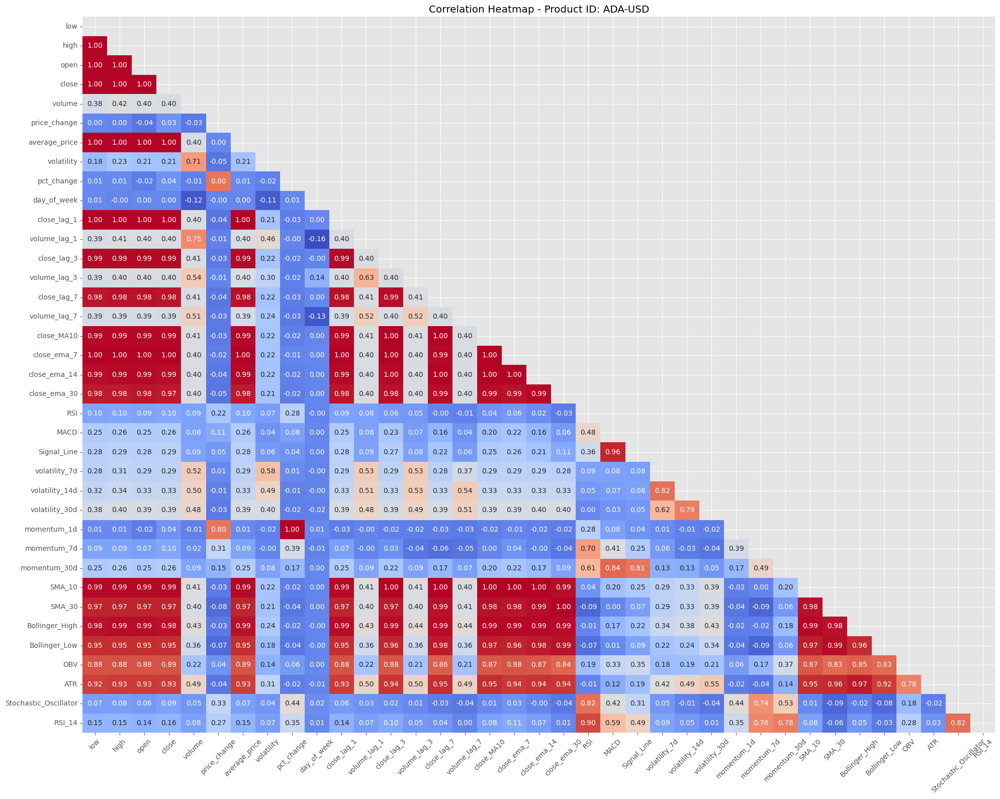

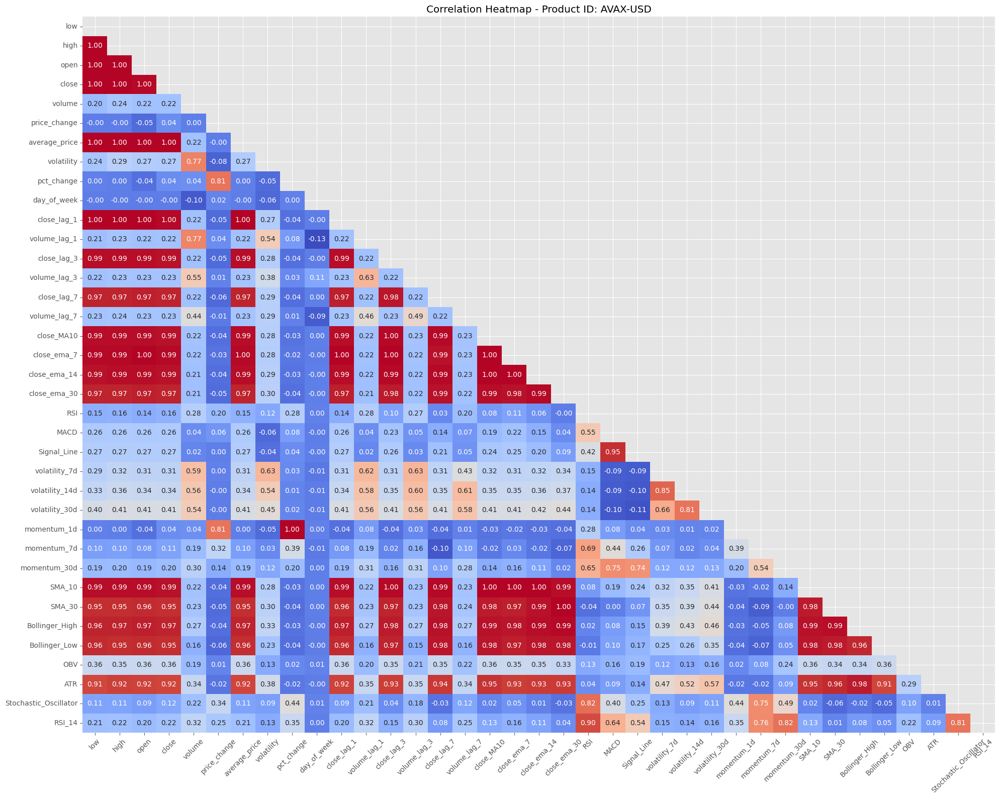

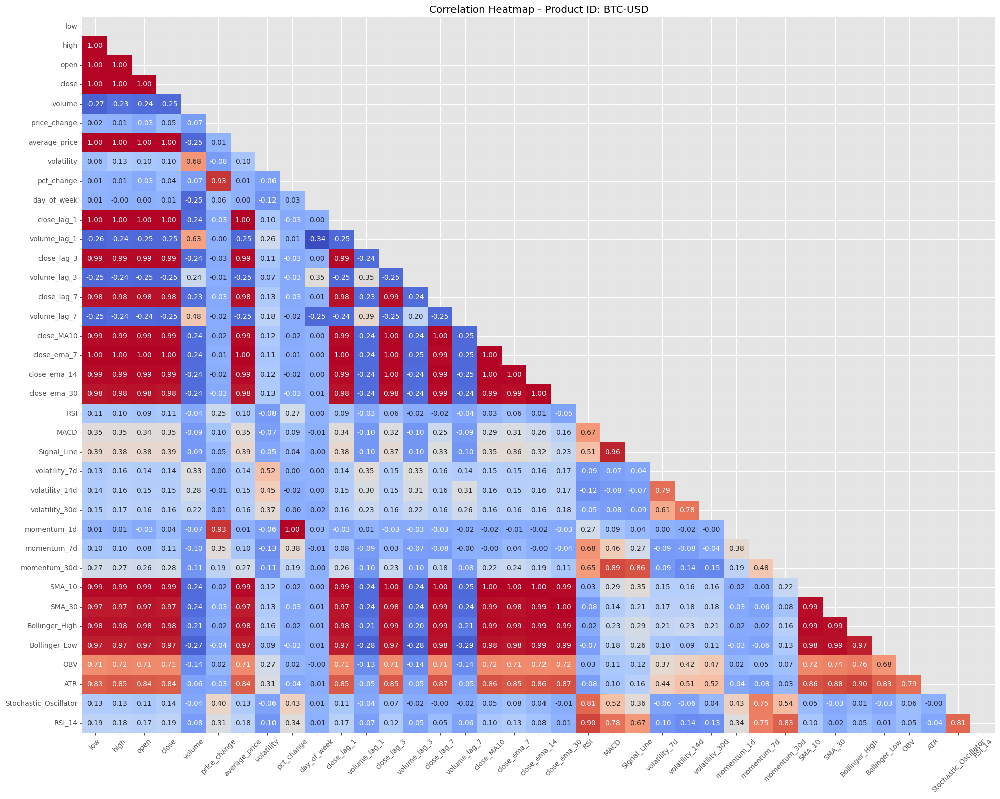

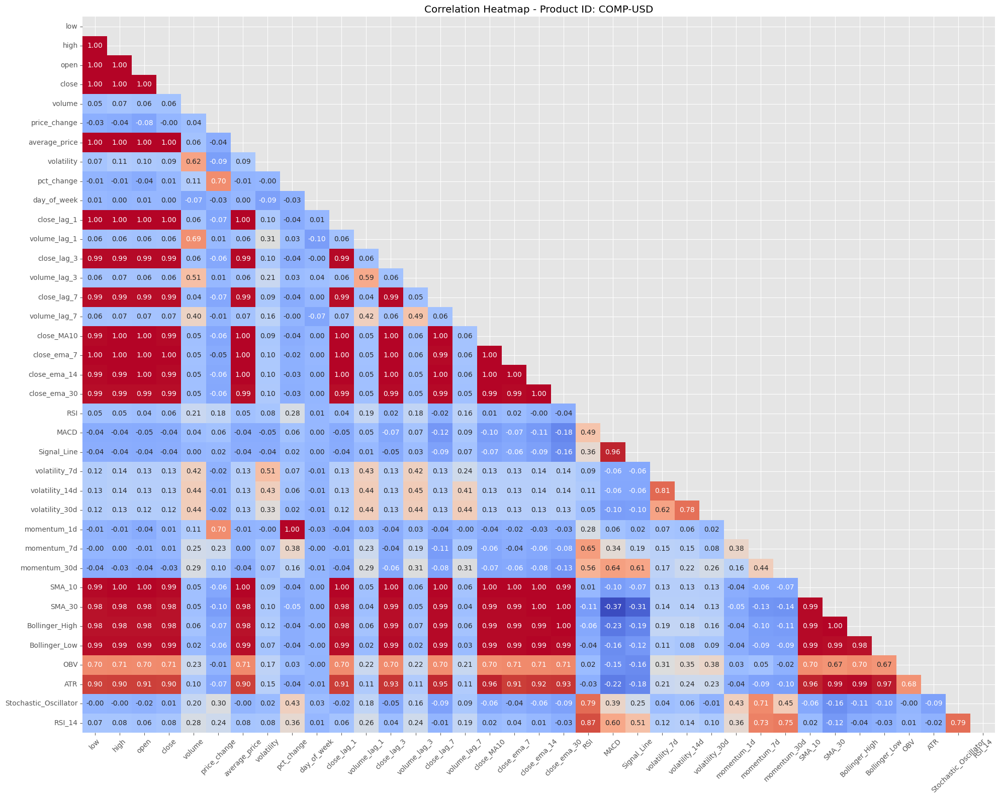

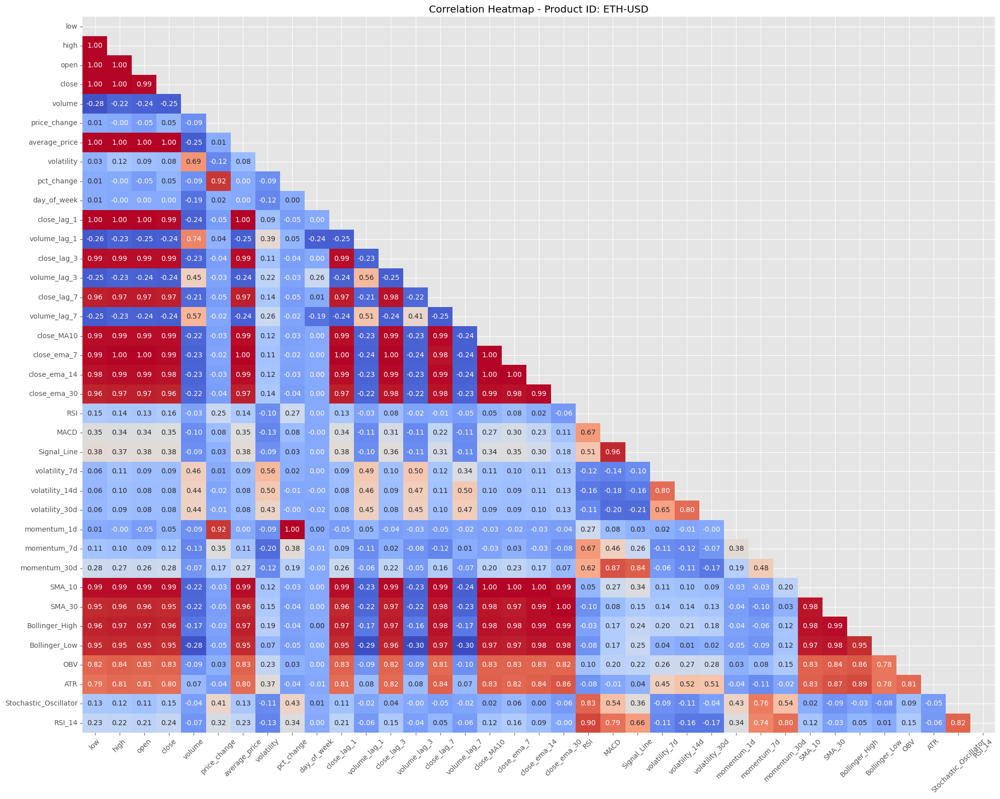

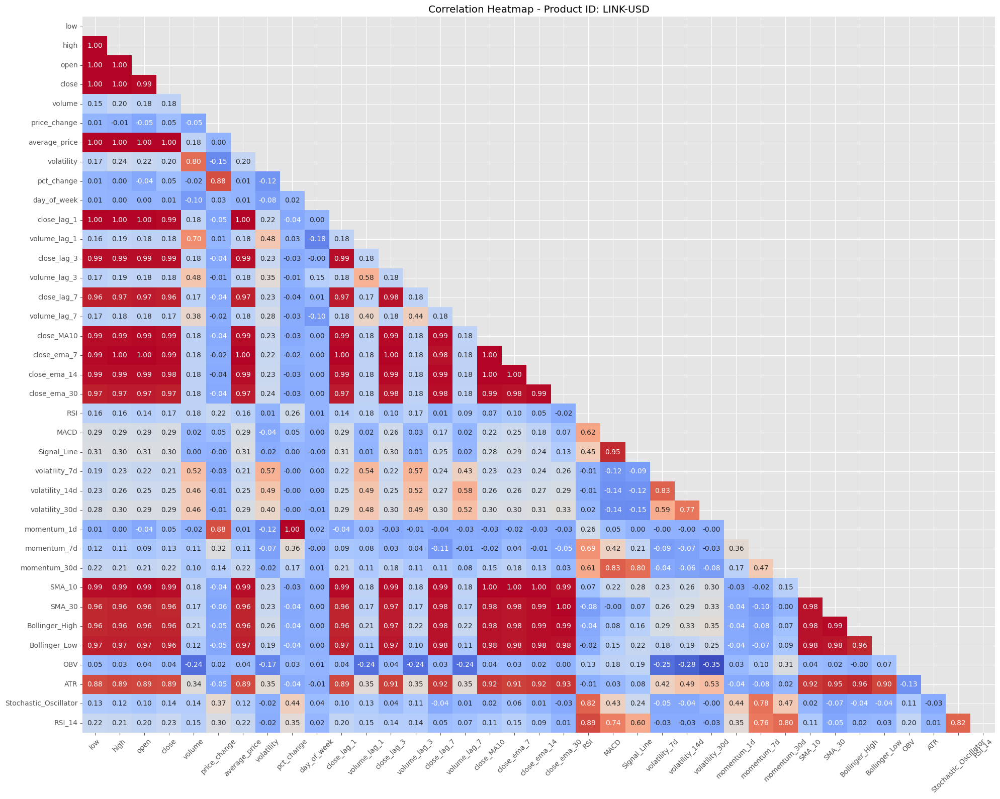

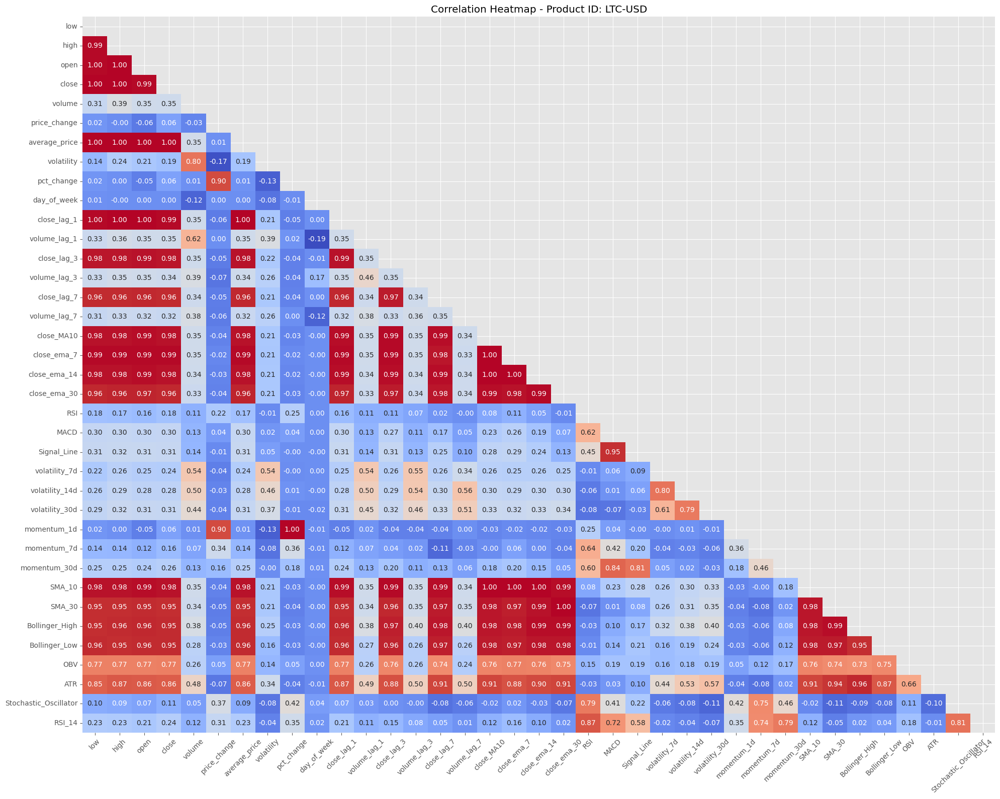

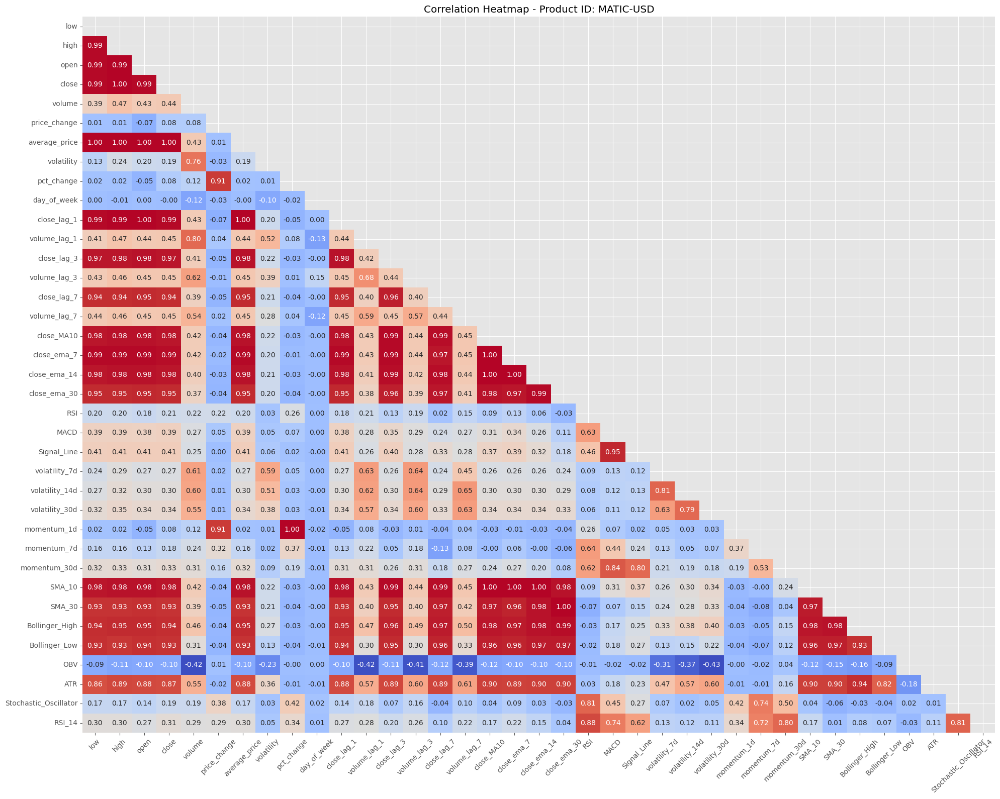

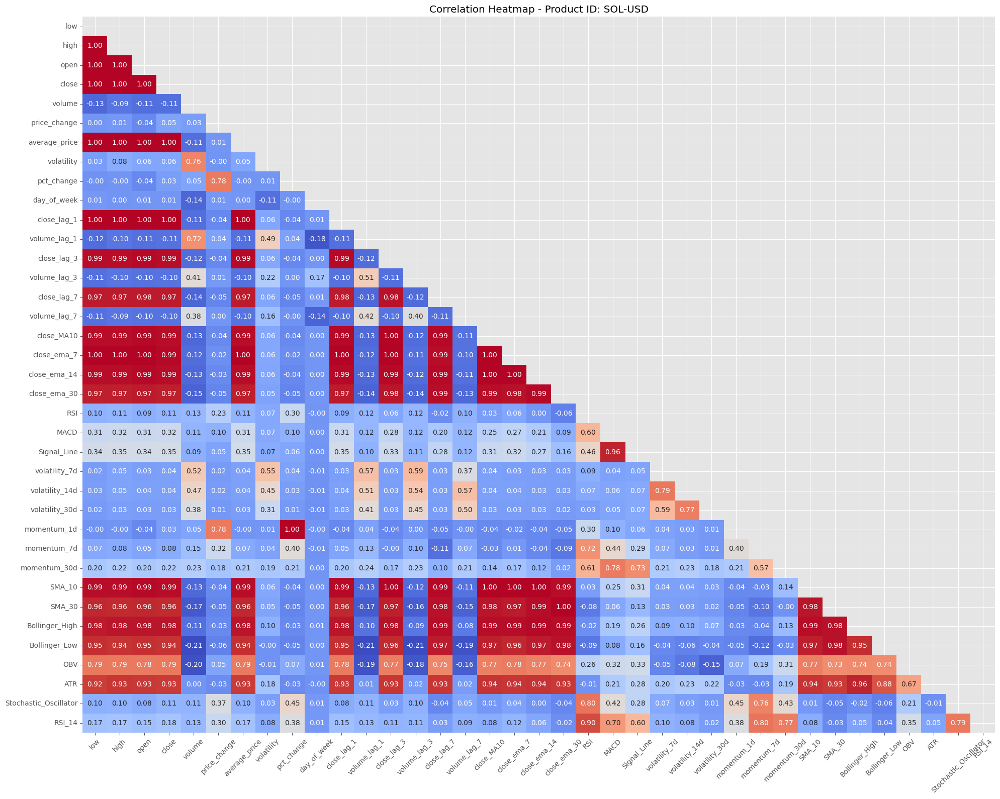

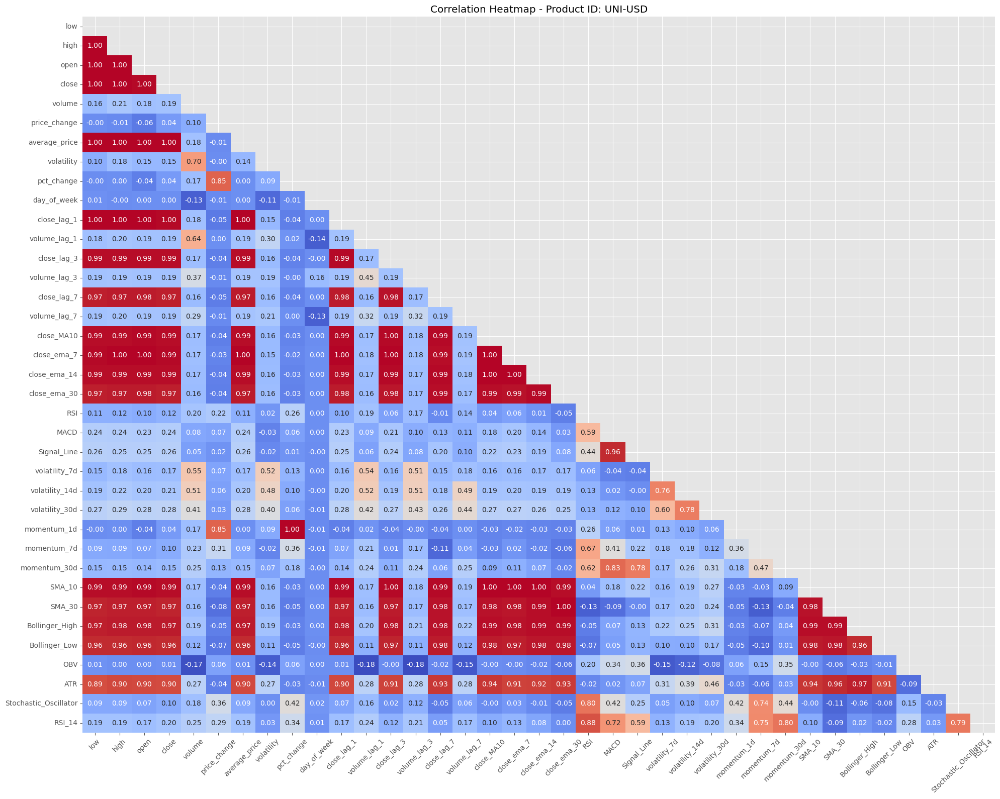

In [13]:
# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group (up to 10 groups)
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break
    
    # Select numeric columns based on dtype
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    
    # Compute correlations for the group
    corr = group[numeric_columns].corr()
    
    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    # Initialize a figure with larger size
    plt.figure(figsize=(20, 16))
    
    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)
    
    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    
    # Show plot
    plt.tight_layout()
    plt.show()


In [14]:
# Print all unique product IDs
unique_product_ids = df['product_id'].unique()
print("Unique Product IDs:")
for product_id in unique_product_ids:
    print(product_id)


Unique Product IDs:
ADA-USD
COMP-USD
ETH-USD
LINK-USD
LTC-USD
MATIC-USD
SOL-USD
UNI-USD
BTC-USD
AVAX-USD


In [15]:
# Columns to drop
columns_to_drop = [
    'average_price', 'close_lag_1', 'close_lag_3', 'close_lag_7',
    'close_MA10', 'close_ema_7', 'close_ema_14', 'close_ema_30','SMA_10','SMA_30','Bollinger_High','Bollinger_Low', 'OBV', 'ATR','Stochastic_Oscillator'
]

# Drop the specified columns
df.drop(columns=columns_to_drop, inplace=True)
df.head(2)

,time,product_id,low,high,open,close,volume,price_change,volatility,pct_change,day_of_week,day_name,volume_lag_1,volume_lag_3,volume_lag_7,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d,RSI_14
0,2021-07-16,ADA-USD,1.1661,1.2452,1.2249,1.1714,3.676491e+07,-0.0535,6.783295,NaN,3,Thursday,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-07-16,COMP-USD,367.1000,410.5000,398.4500,367.8900,2.381554e+04,-30.5600,11.822392,NaN,3,Thursday,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


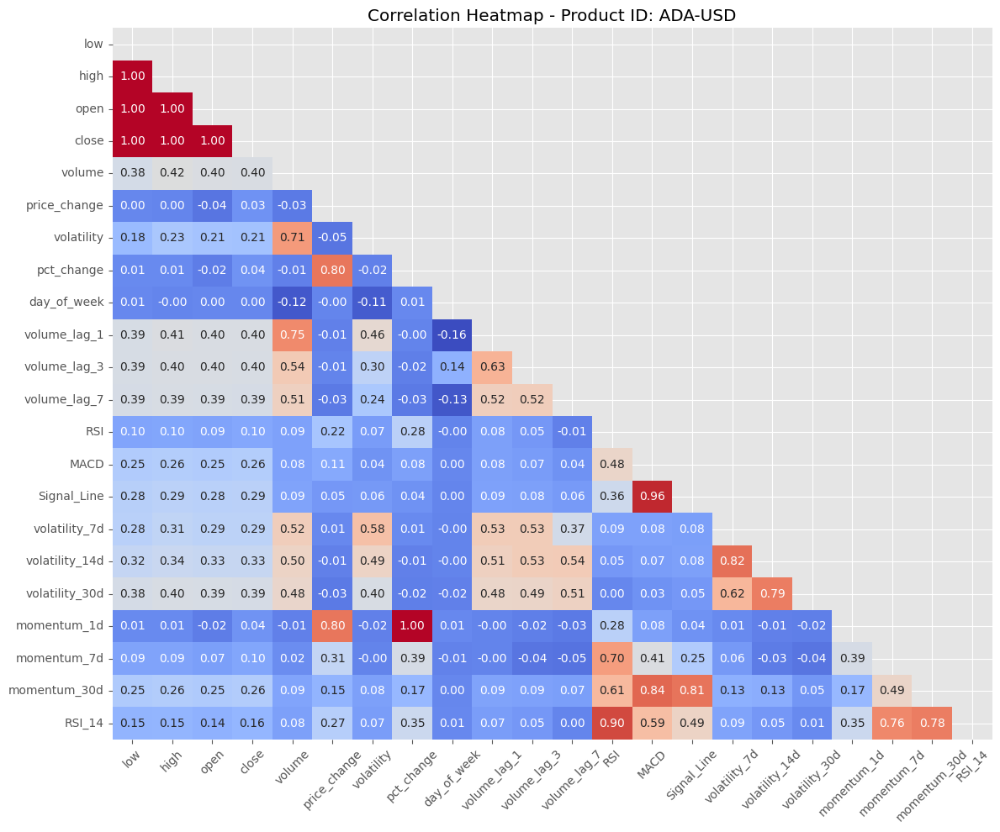

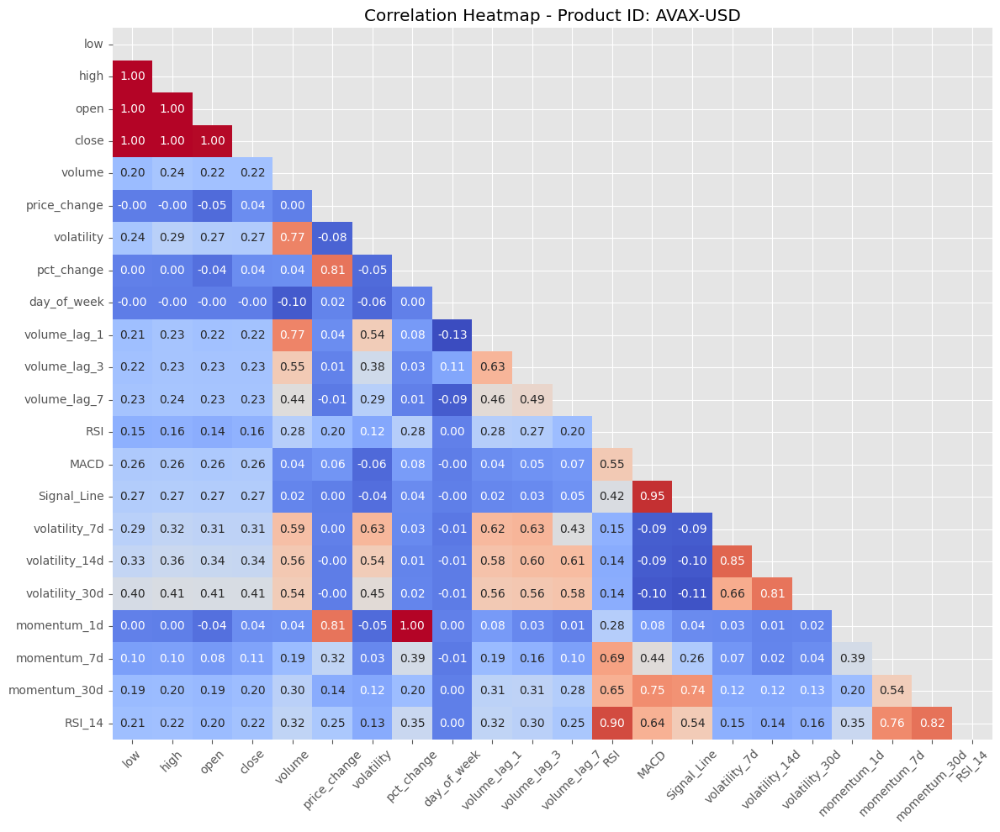

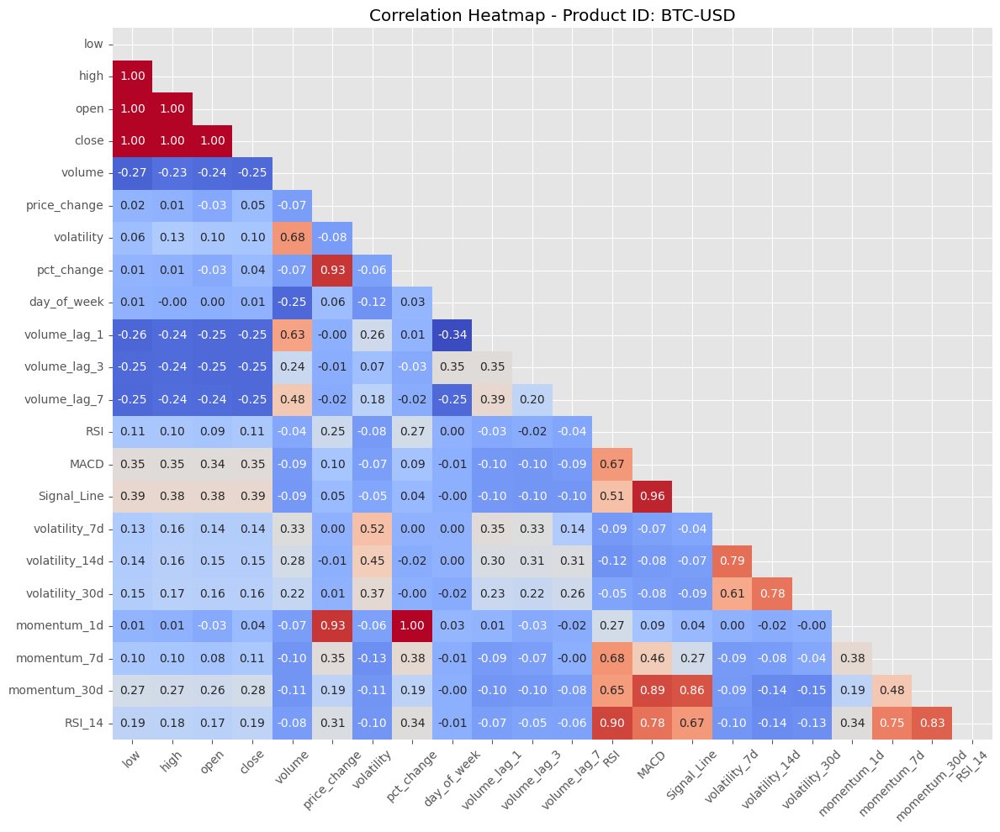

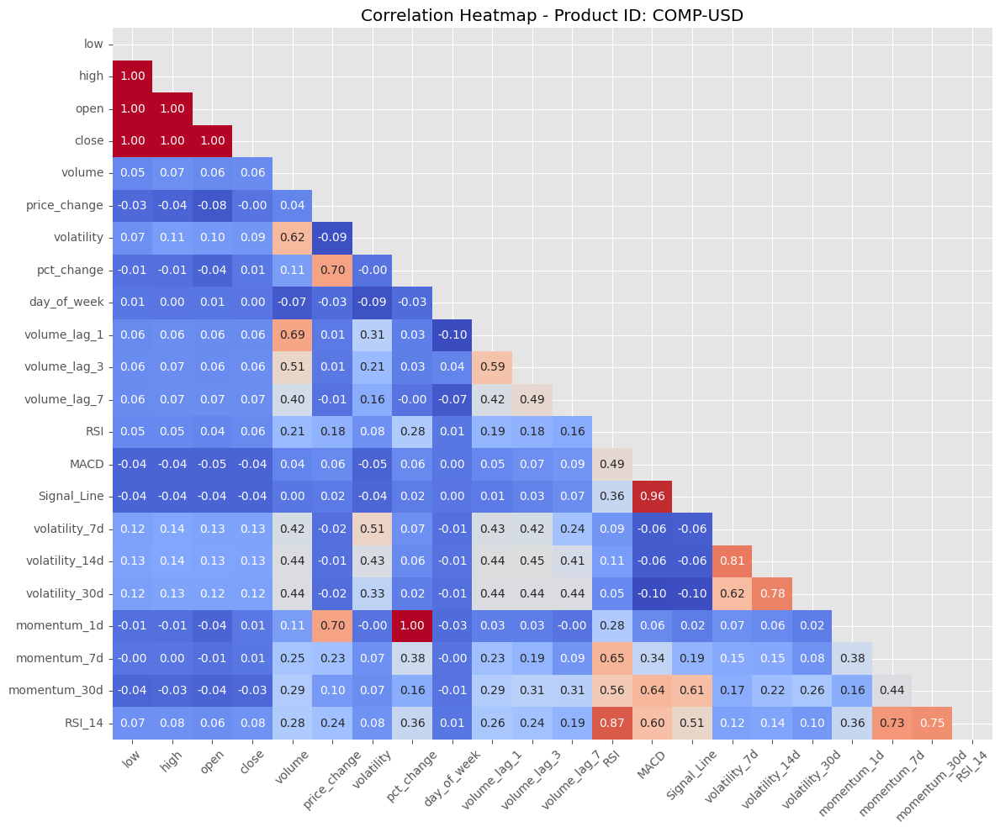

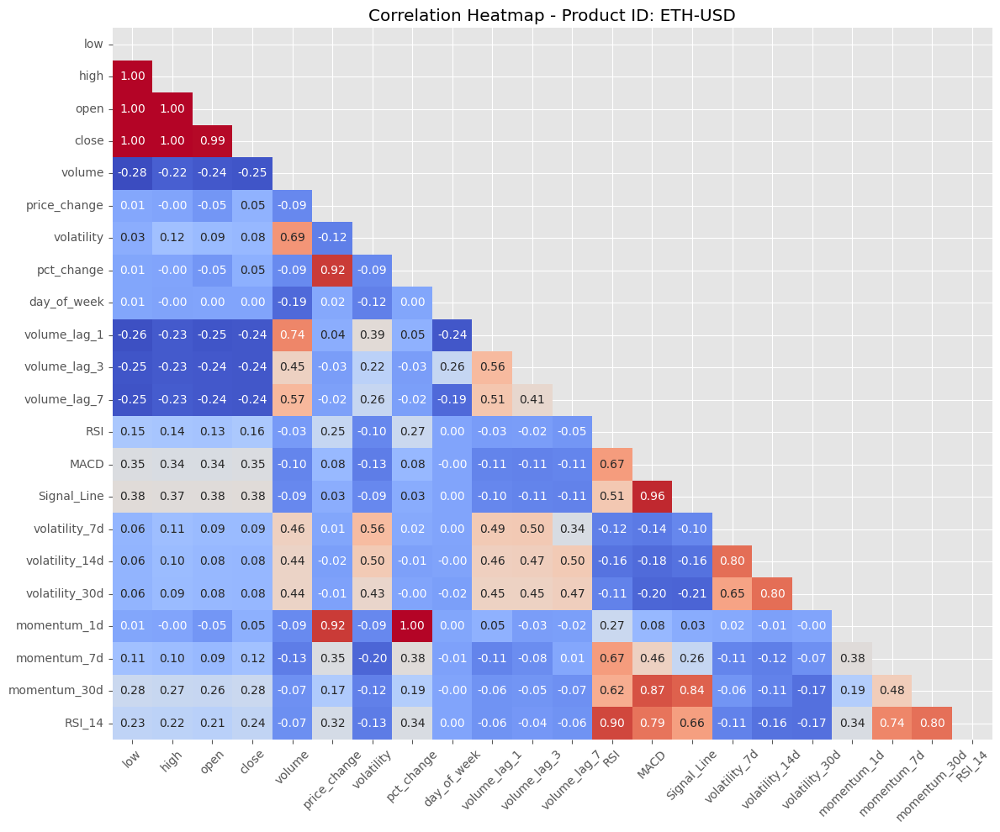

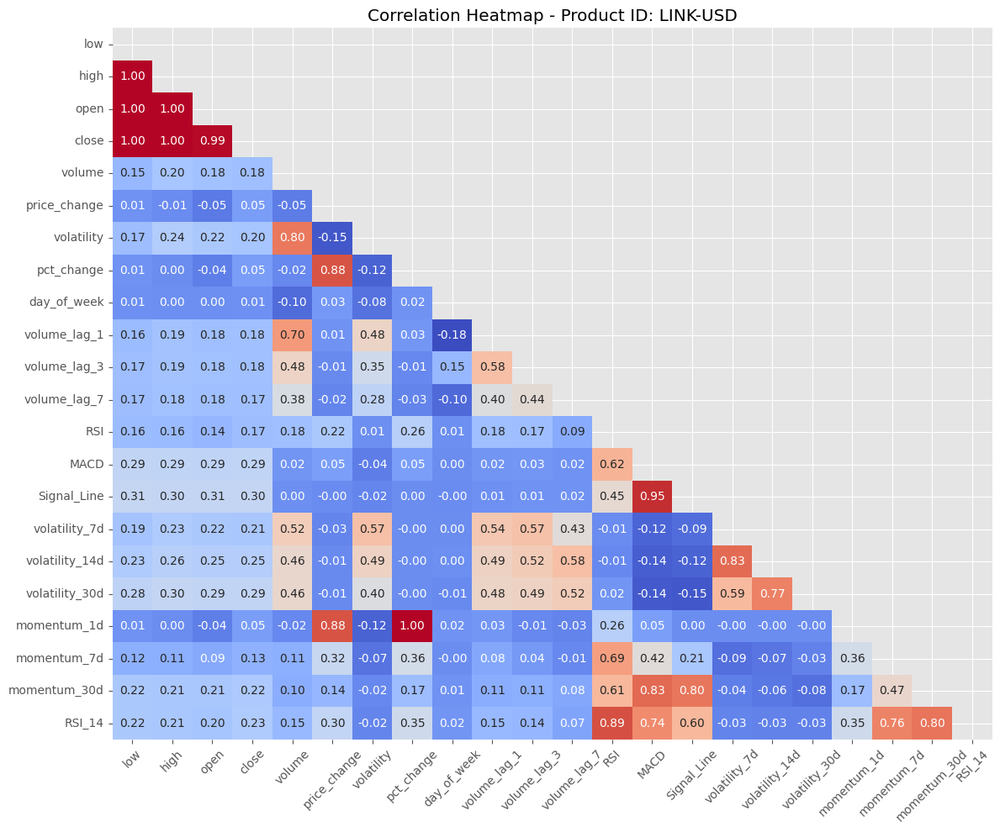

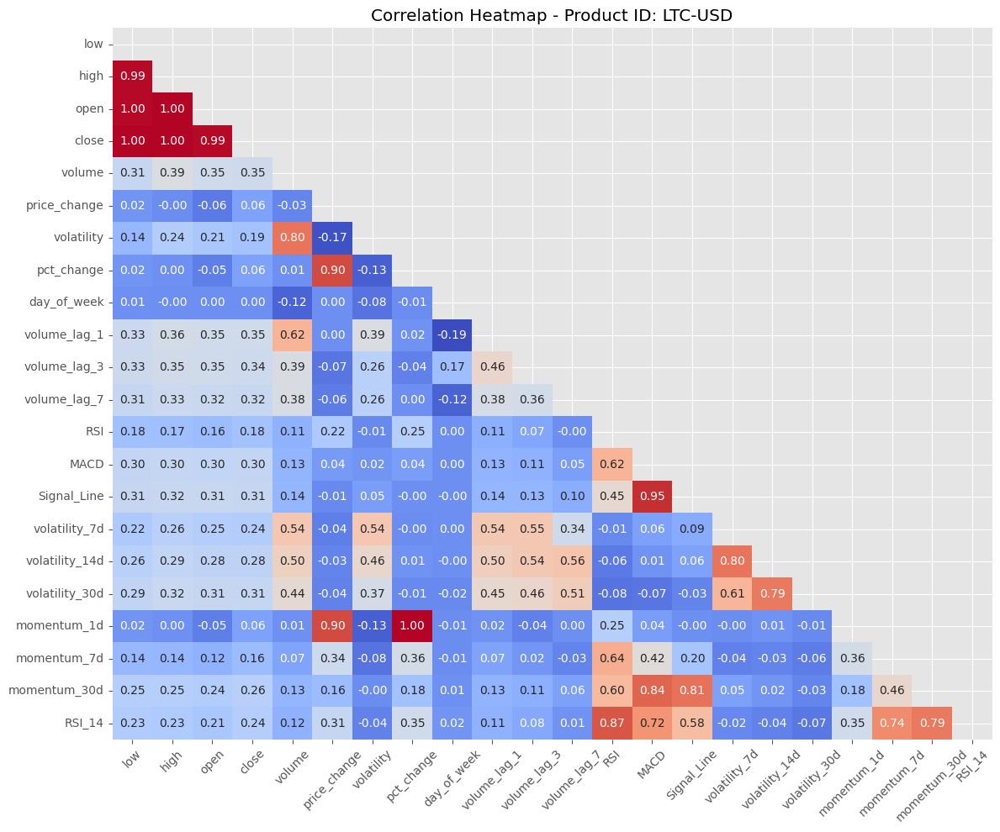

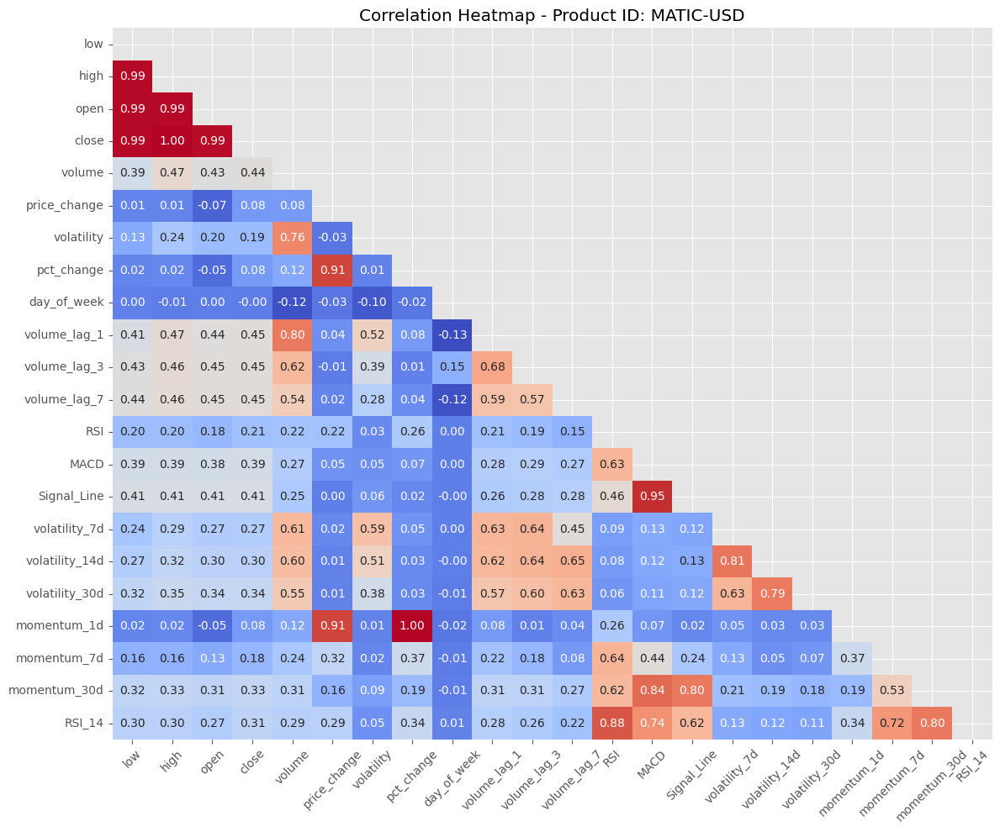

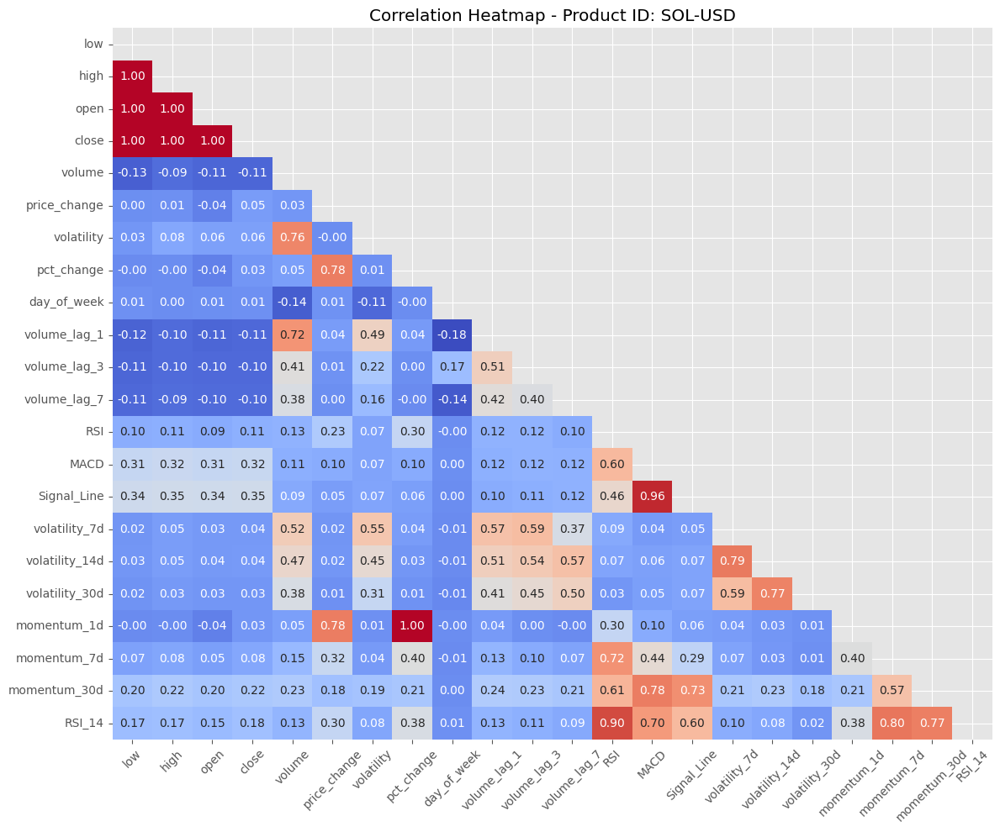

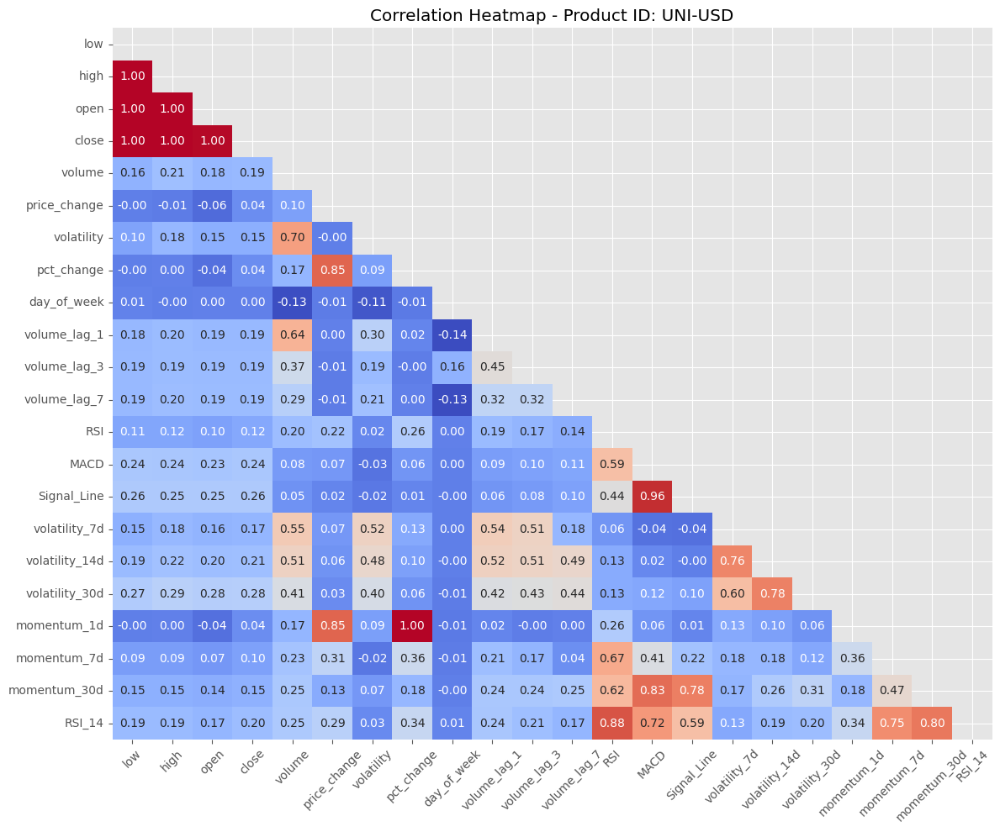

In [16]:
# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group (up to 10 groups)
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break
    
    # Select numeric columns based on dtype
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    
    # Compute correlations for the group
    corr = group[numeric_columns].corr()
    
    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    # Initialize a figure with larger size
    plt.figure(figsize=(12, 10))
    
    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)
    
    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    
    # Show plot
    plt.tight_layout()
    plt.show()

In [17]:
# Drop additional columns due to high multicollinearity with 'close'
additional_columns_to_drop = ['open', 'high', 'price_change']
df.drop(columns=additional_columns_to_drop, inplace=True)


Features to drop due to high correlation in ADA-USD (>0.8): ['RSI_14', 'momentum_30d', 'momentum_1d', 'volatility_14d', 'Signal_Line']


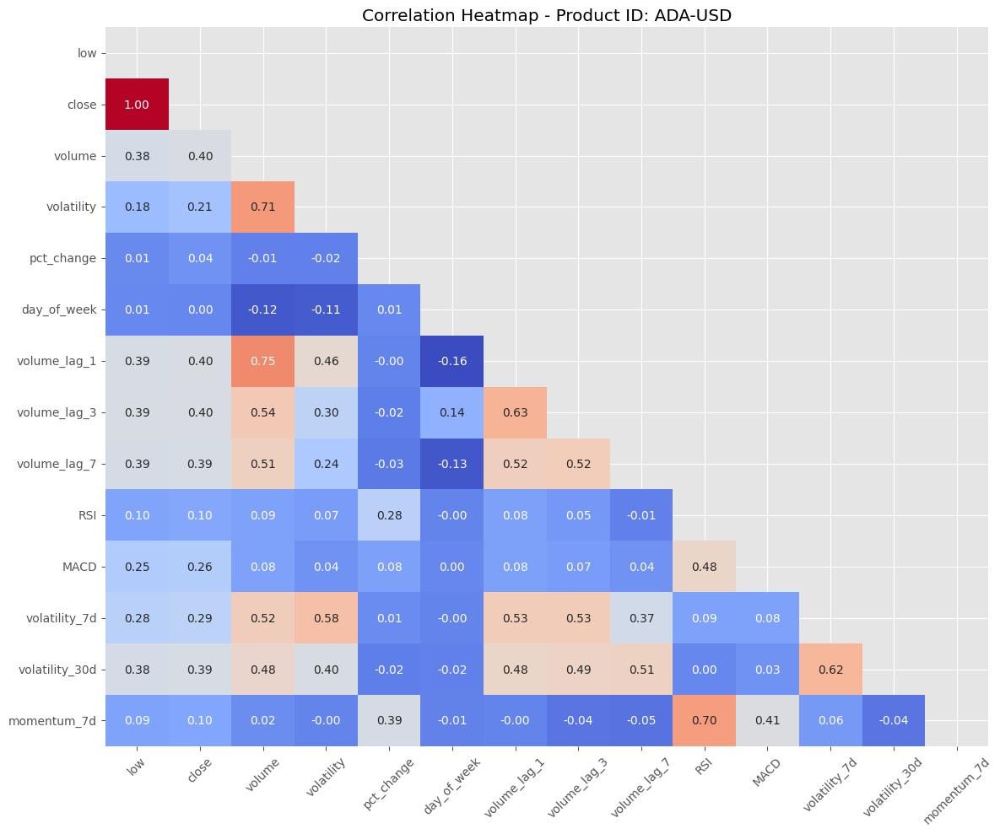

Features to drop due to high correlation in AVAX-USD (>0.8): ['RSI_14', 'momentum_1d', 'volatility_30d', 'volatility_14d', 'Signal_Line']


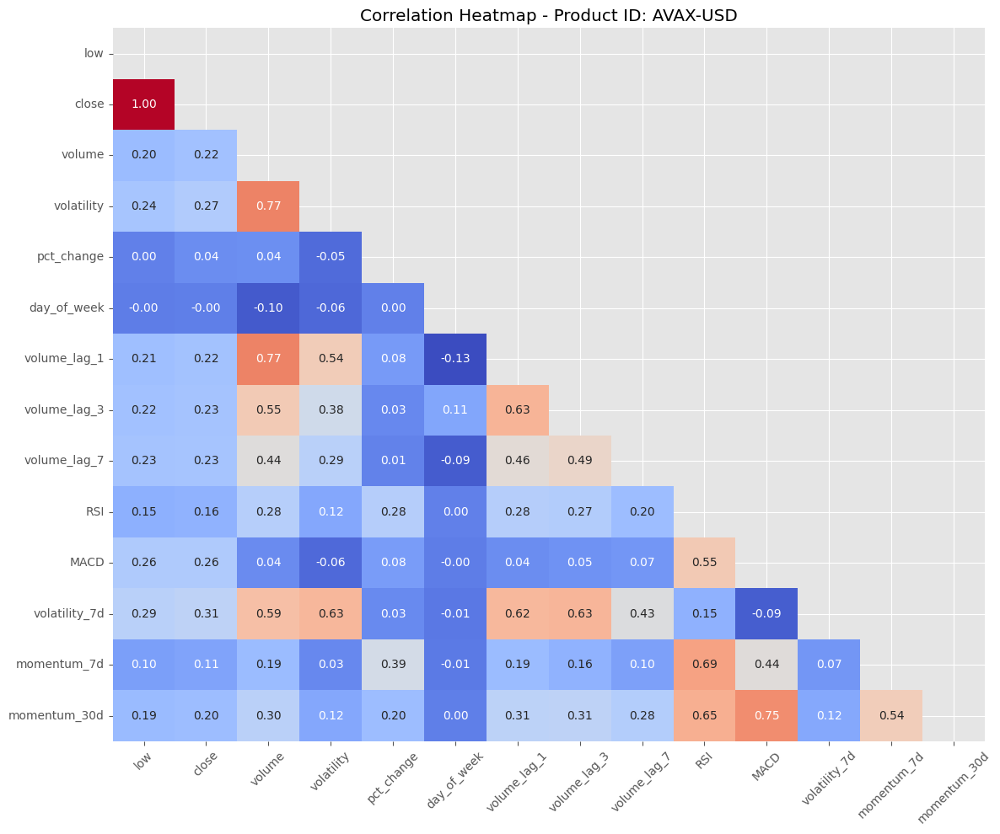

Features to drop due to high correlation in BTC-USD (>0.8): ['momentum_30d', 'momentum_1d', 'Signal_Line', 'RSI_14']


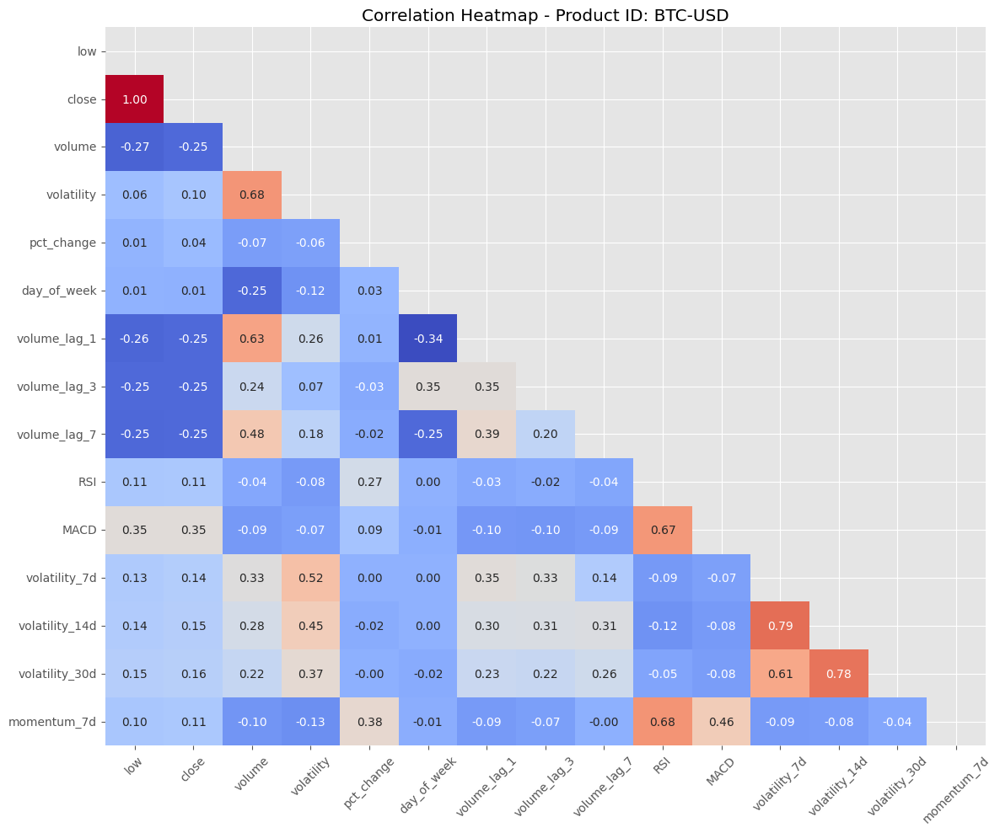

Features to drop due to high correlation in COMP-USD (>0.8): ['volatility_14d', 'momentum_1d', 'Signal_Line', 'RSI_14']


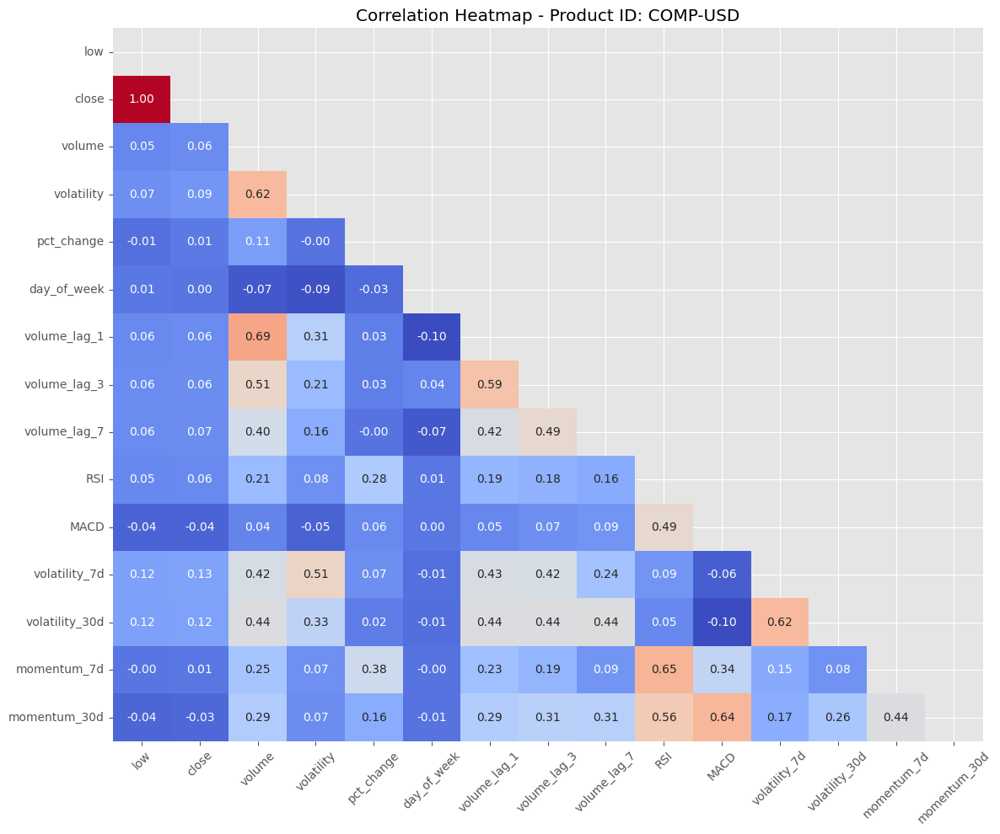

Features to drop due to high correlation in ETH-USD (>0.8): ['RSI_14', 'momentum_30d', 'momentum_1d', 'volatility_30d', 'volatility_14d', 'Signal_Line']


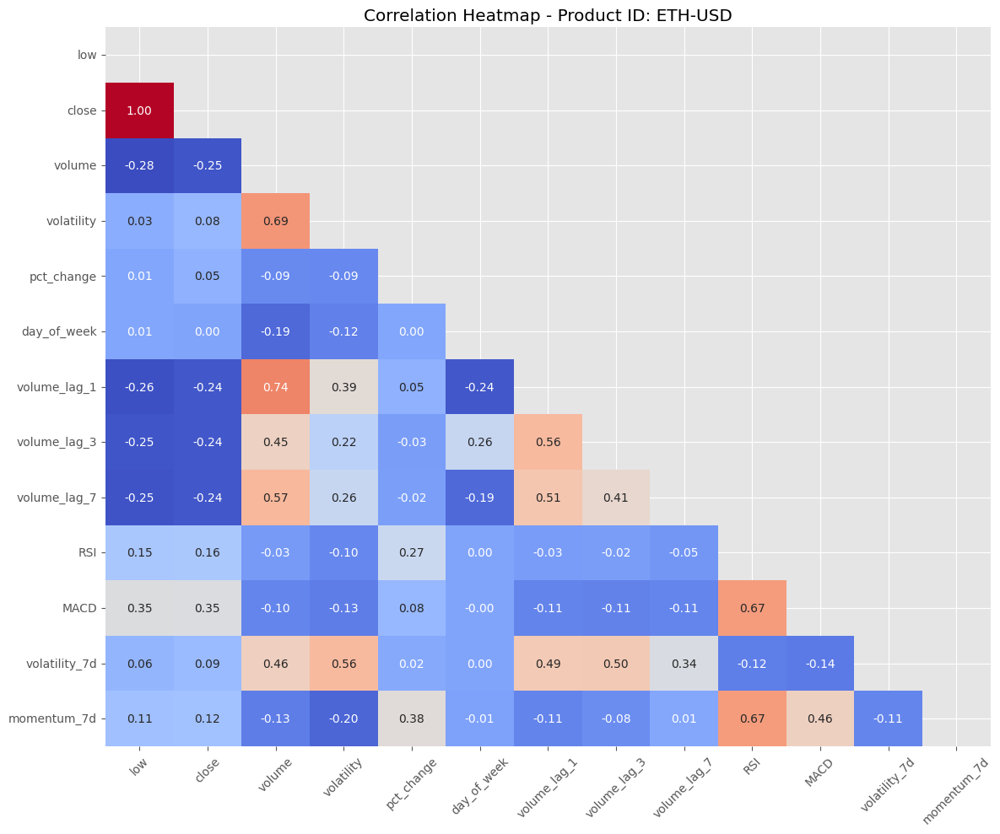

Features to drop due to high correlation in LINK-USD (>0.8): ['RSI_14', 'momentum_30d', 'momentum_1d', 'volatility_14d', 'Signal_Line']


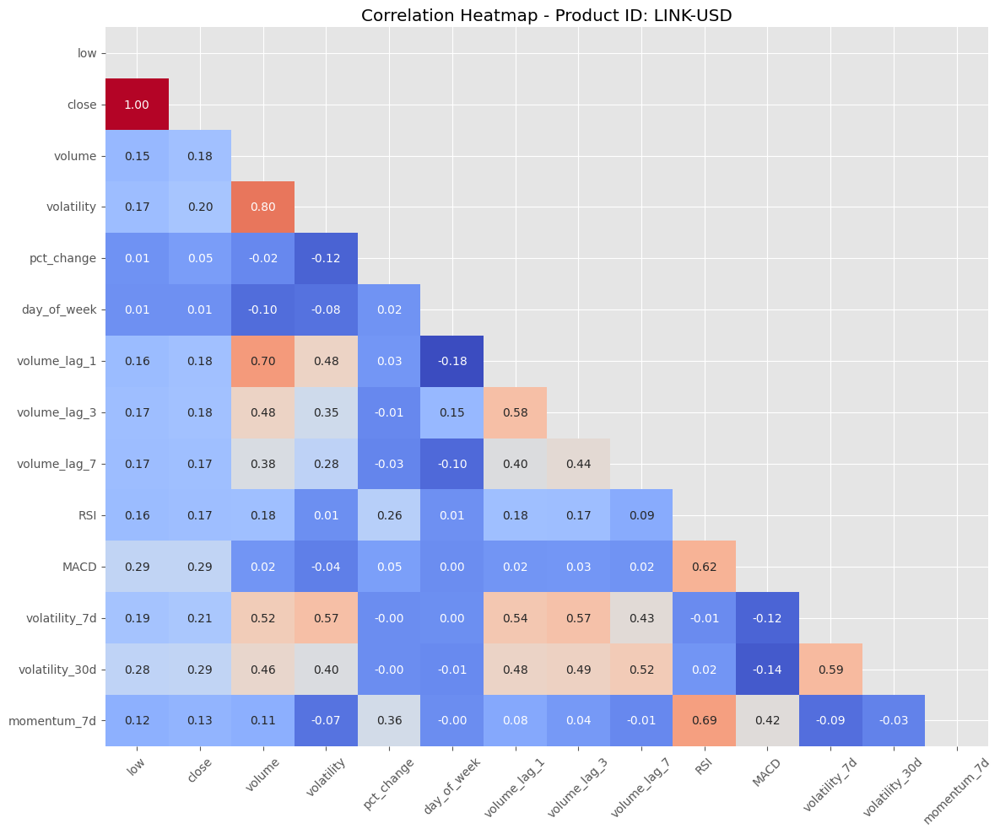

Features to drop due to high correlation in LTC-USD (>0.8): ['RSI_14', 'momentum_30d', 'volatility', 'momentum_1d', 'volatility_14d', 'Signal_Line']


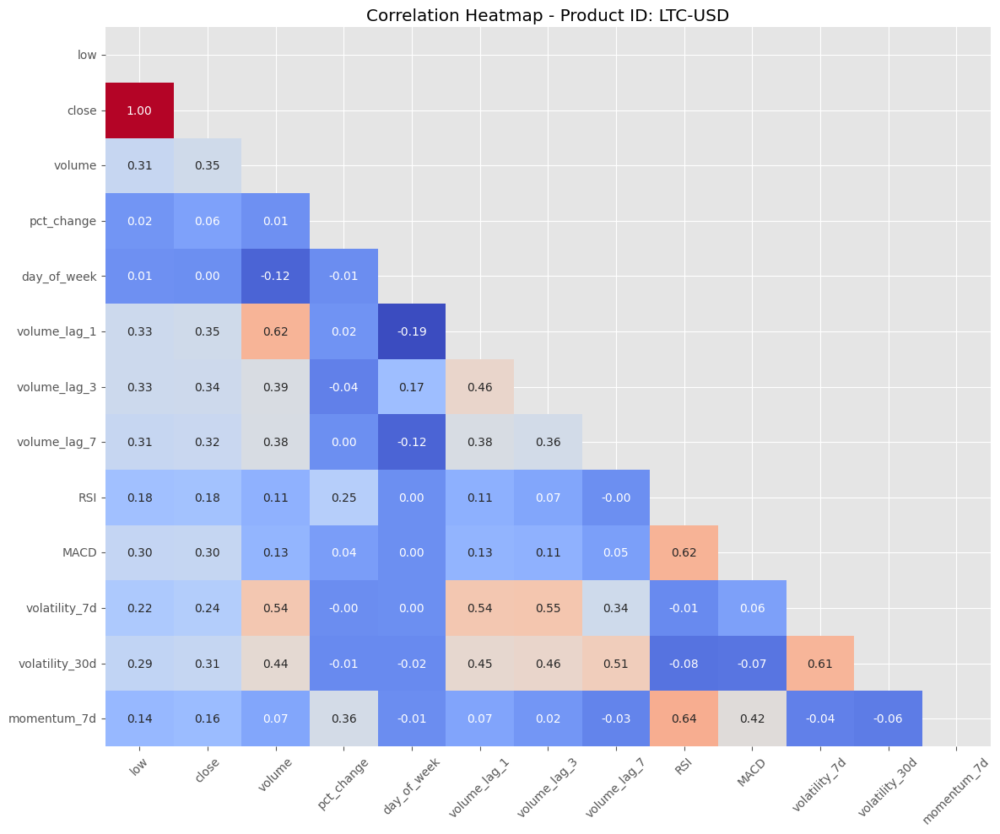

Features to drop due to high correlation in MATIC-USD (>0.8): ['RSI_14', 'momentum_30d', 'momentum_1d', 'volatility_14d', 'Signal_Line']


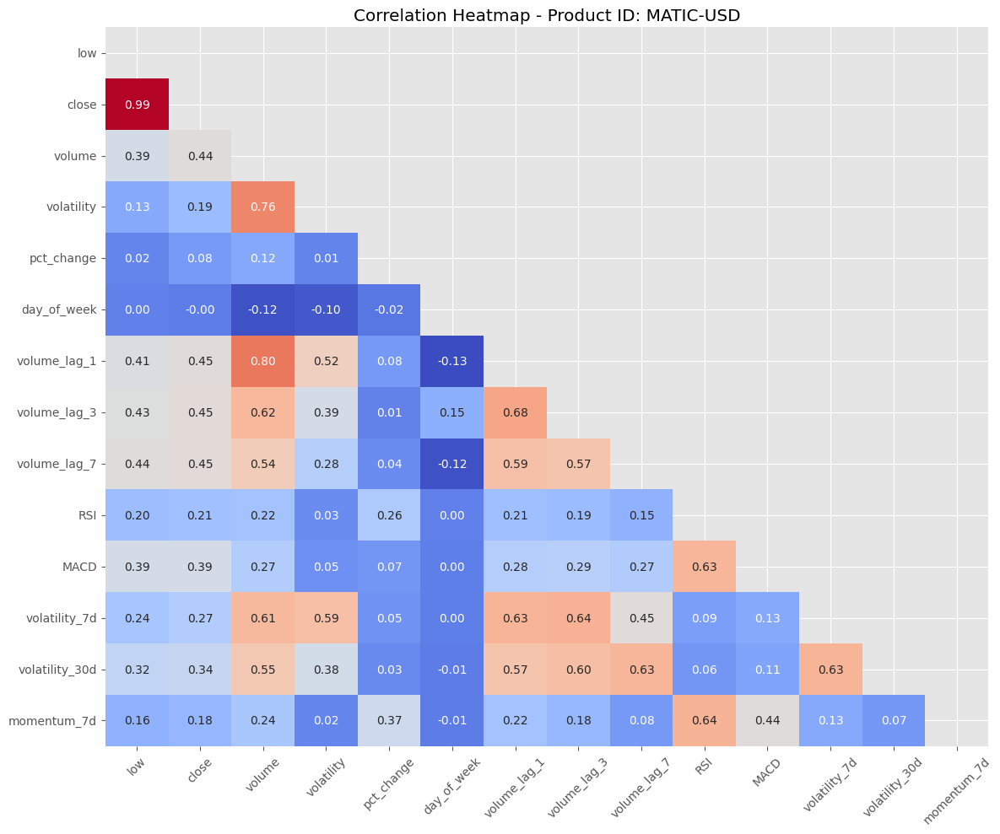

Features to drop due to high correlation in SOL-USD (>0.8): ['momentum_1d', 'Signal_Line', 'RSI_14']


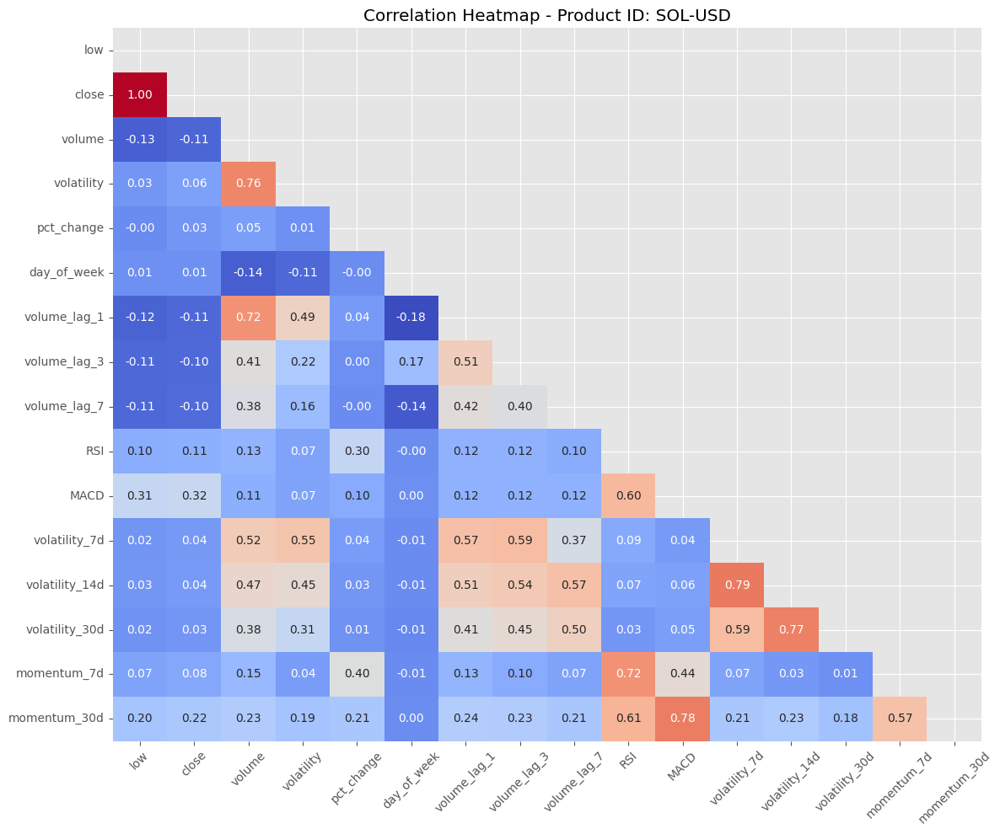

Features to drop due to high correlation in UNI-USD (>0.8): ['momentum_30d', 'momentum_1d', 'Signal_Line', 'RSI_14']


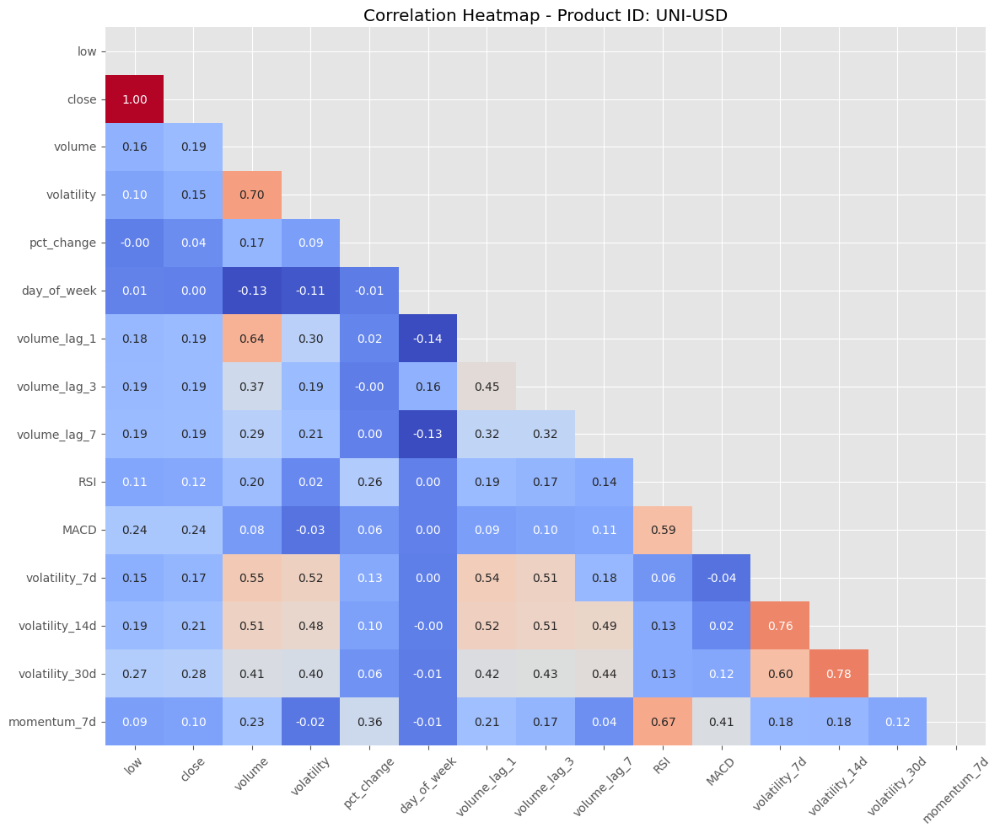

In [18]:
# Function to filter out highly correlated features, ensuring 'close' is retained
def filter_high_correlation(corr_matrix, threshold=0.80):
    to_drop = set()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.columns[i] == 'close':
                continue
            if abs(corr_matrix.iloc[i, j]) > threshold:
                to_drop.add(corr_matrix.columns[i])
    return list(to_drop)

# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group and plot correlation matrix
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break

    # Initial computation of correlations
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Filter out highly correlated features and drop them
    high_corr_features = filter_high_correlation(corr, threshold=0.80)
    print(f"Features to drop due to high correlation in {product_id} (>{0.80}): {high_corr_features}")

    # Drop the highly correlated features
    group = group.drop(columns=high_corr_features)

    # Recompute correlations after dropping
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Initialize a figure with larger size
    plt.figure(figsize=(12, 10))

    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)

    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)

    # Show plot
    plt.tight_layout()
    plt.show()

Features to drop due to high correlation in ADA-USD (>0.8): ['RSI_14', 'momentum_30d', 'close', 'momentum_1d', 'volatility_14d', 'Signal_Line']


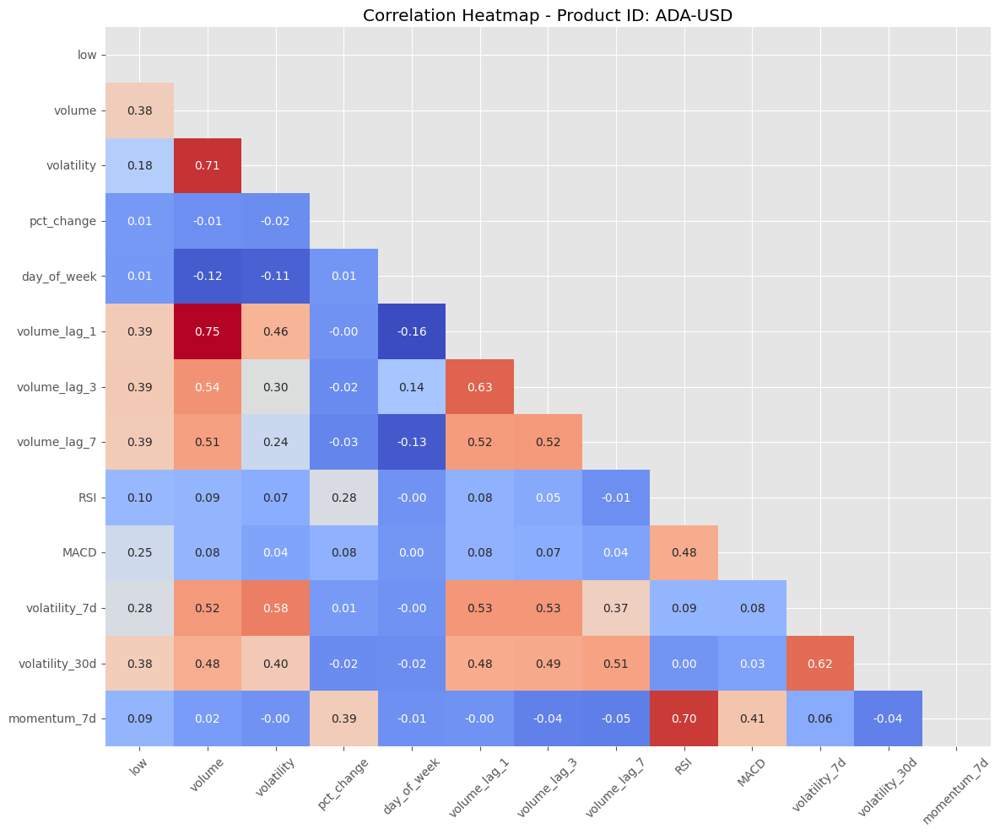

Features to drop due to high correlation in AVAX-USD (>0.8): ['RSI_14', 'close', 'momentum_1d', 'volatility_30d', 'volatility_14d', 'Signal_Line']


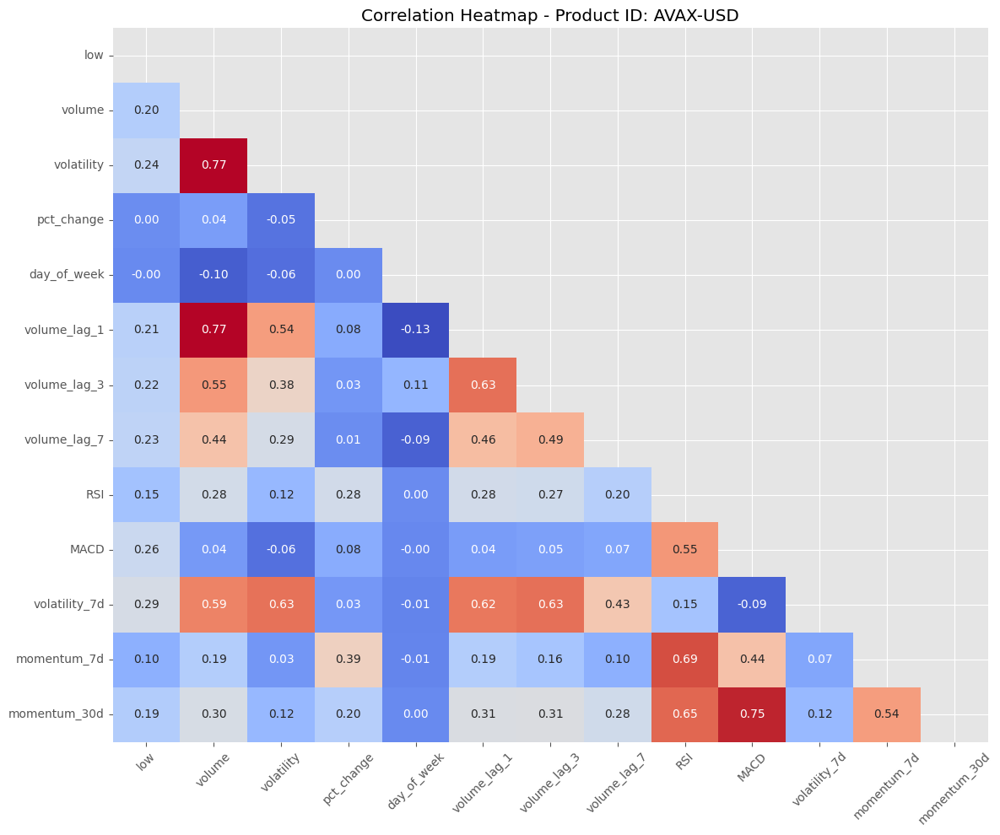

Features to drop due to high correlation in BTC-USD (>0.8): ['RSI_14', 'momentum_30d', 'close', 'momentum_1d', 'Signal_Line']


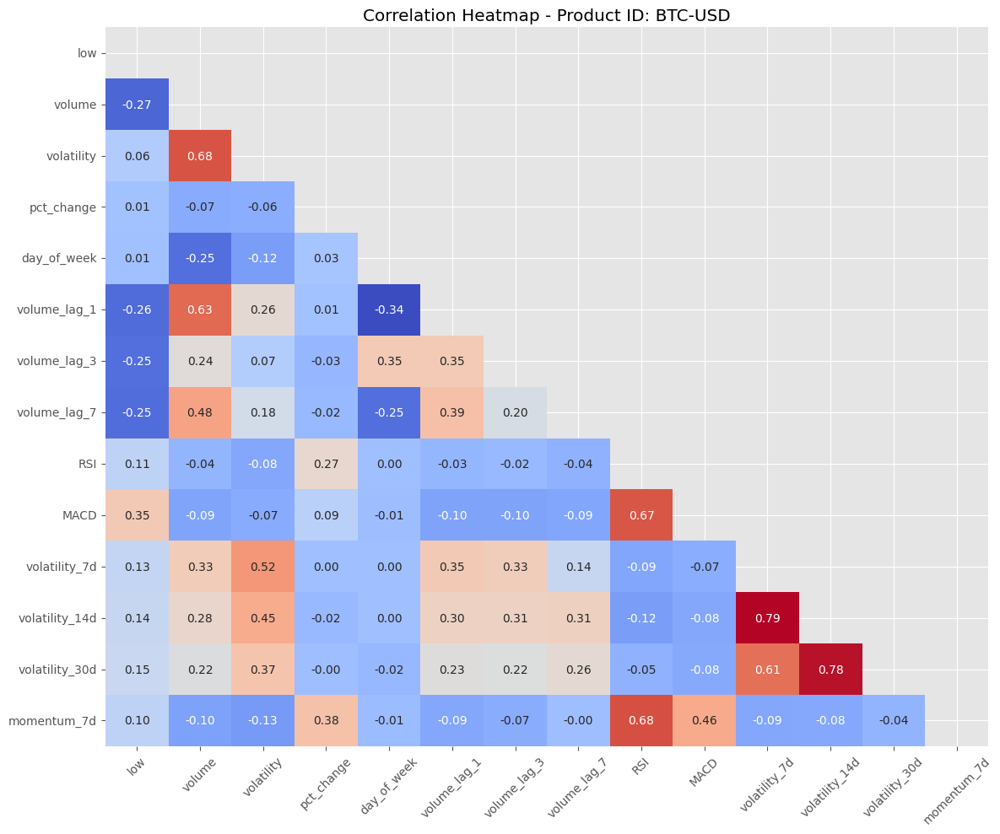

Features to drop due to high correlation in COMP-USD (>0.8): ['RSI_14', 'close', 'momentum_1d', 'volatility_14d', 'Signal_Line']


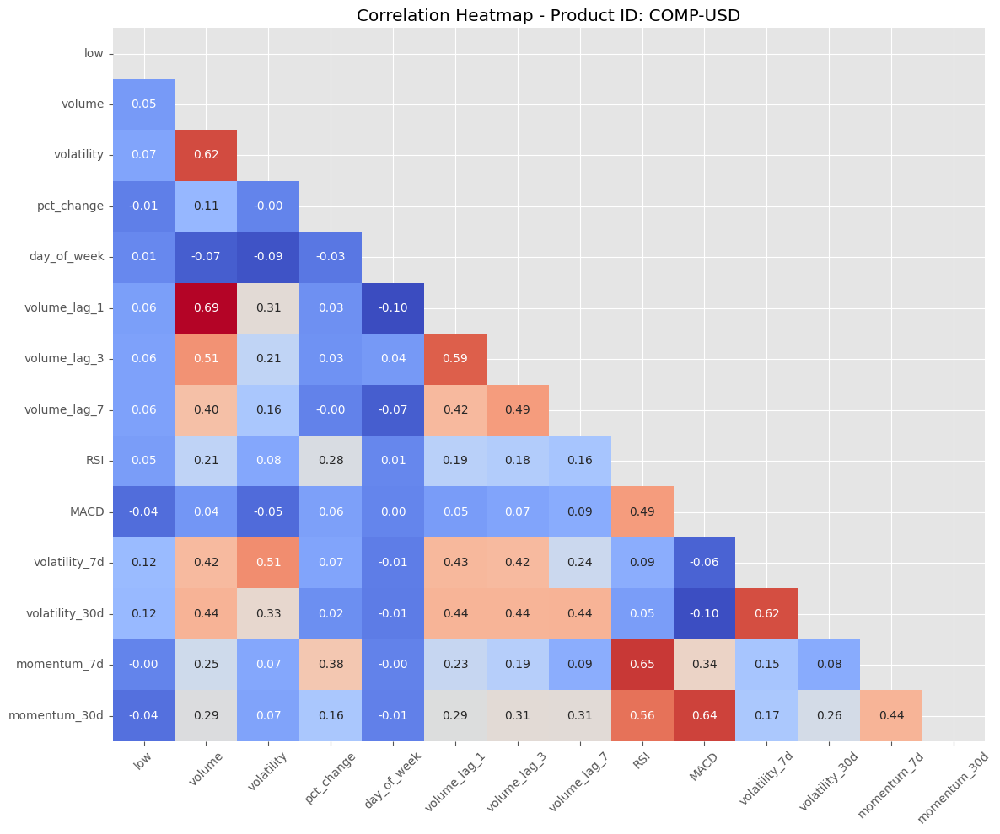

Features to drop due to high correlation in ETH-USD (>0.8): ['RSI_14', 'close', 'momentum_30d', 'momentum_1d', 'volatility_30d', 'volatility_14d', 'Signal_Line']


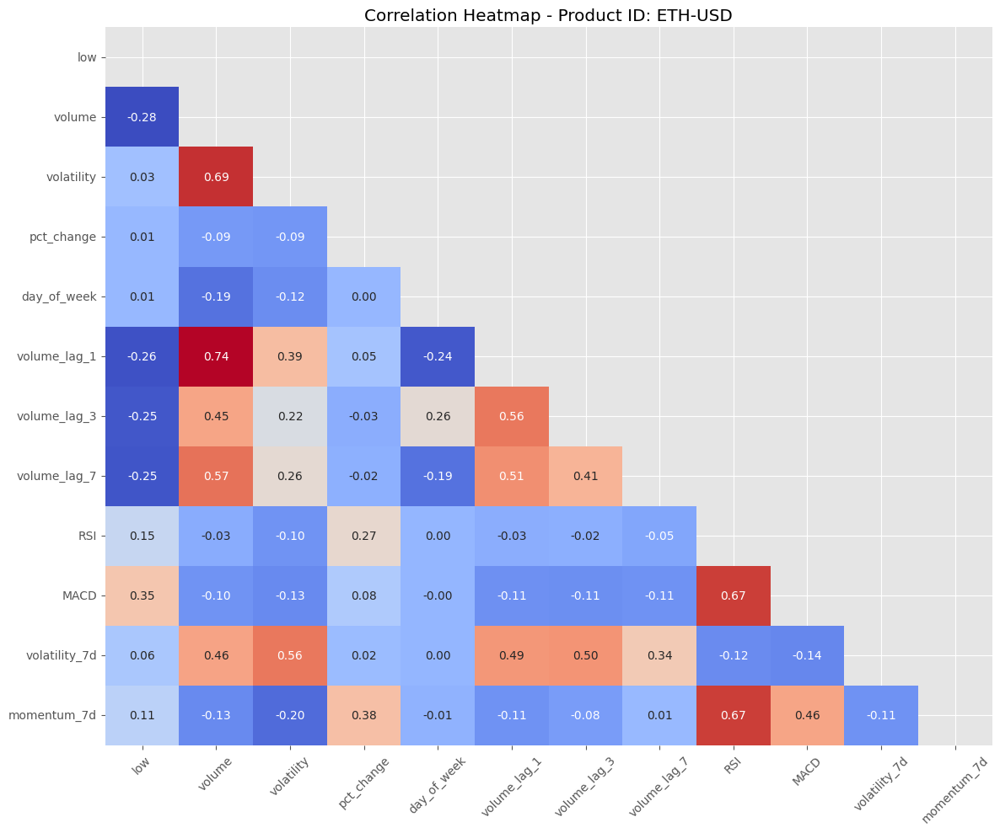

Features to drop due to high correlation in LINK-USD (>0.8): ['RSI_14', 'momentum_30d', 'close', 'momentum_1d', 'volatility_14d', 'Signal_Line']


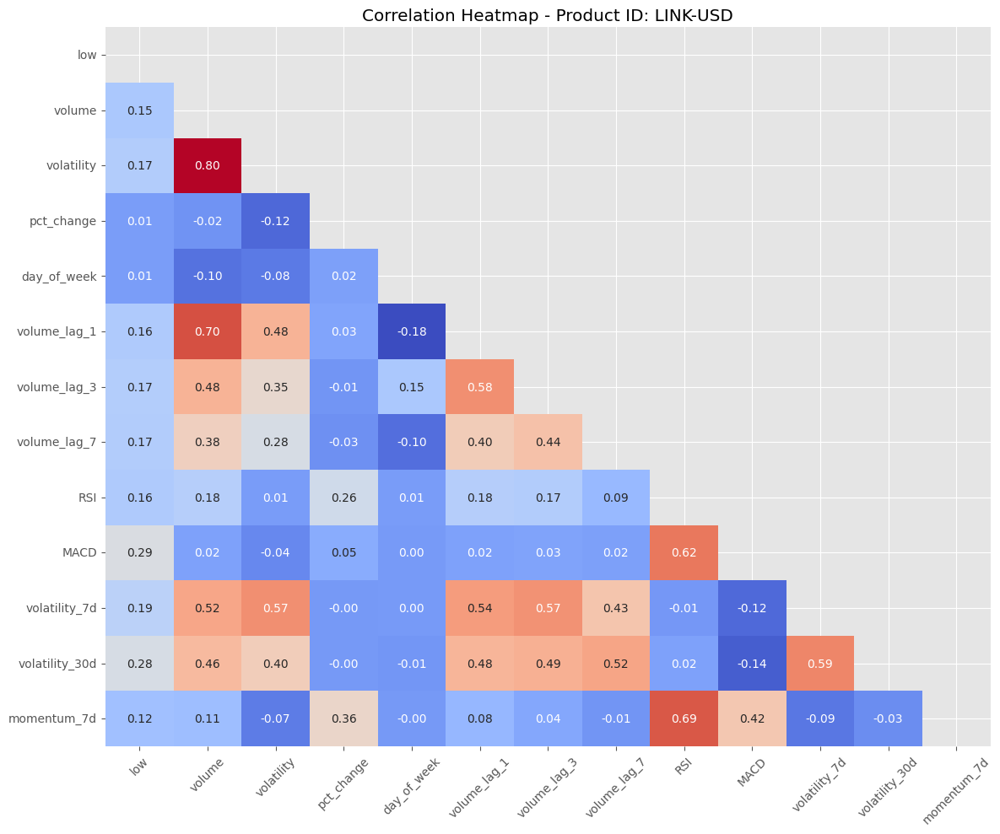

Features to drop due to high correlation in LTC-USD (>0.8): ['RSI_14', 'close', 'momentum_30d', 'volatility', 'momentum_1d', 'volatility_14d', 'Signal_Line']


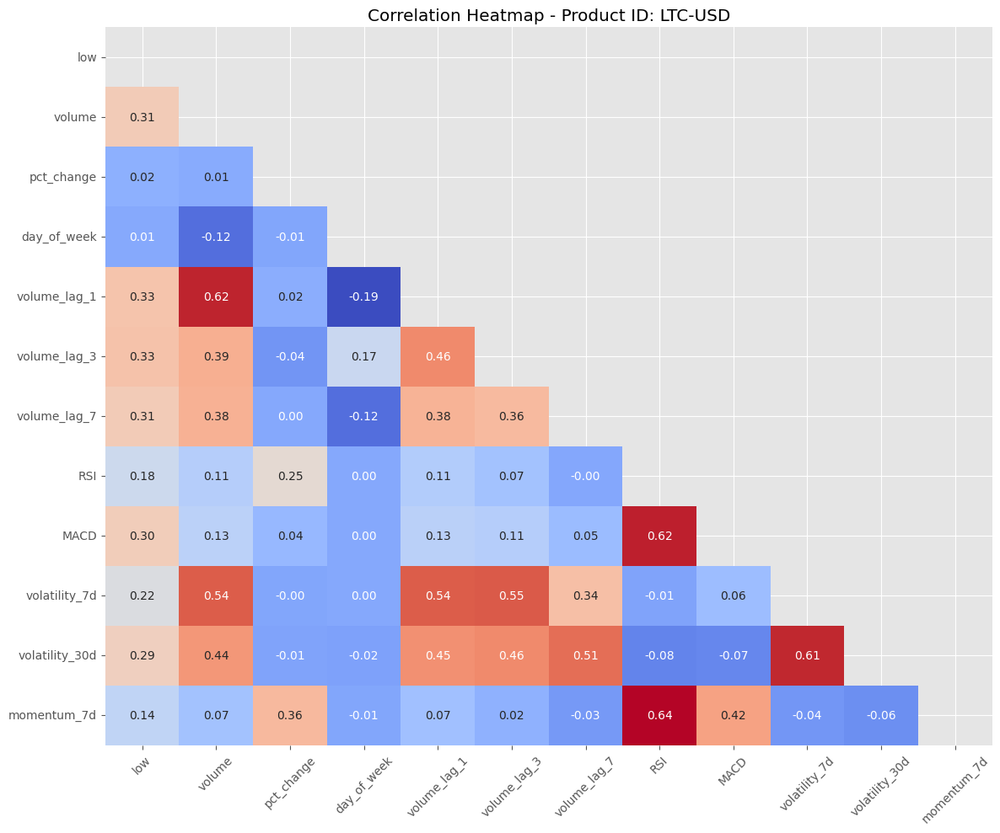

Features to drop due to high correlation in MATIC-USD (>0.8): ['RSI_14', 'momentum_30d', 'close', 'momentum_1d', 'volatility_14d', 'Signal_Line']


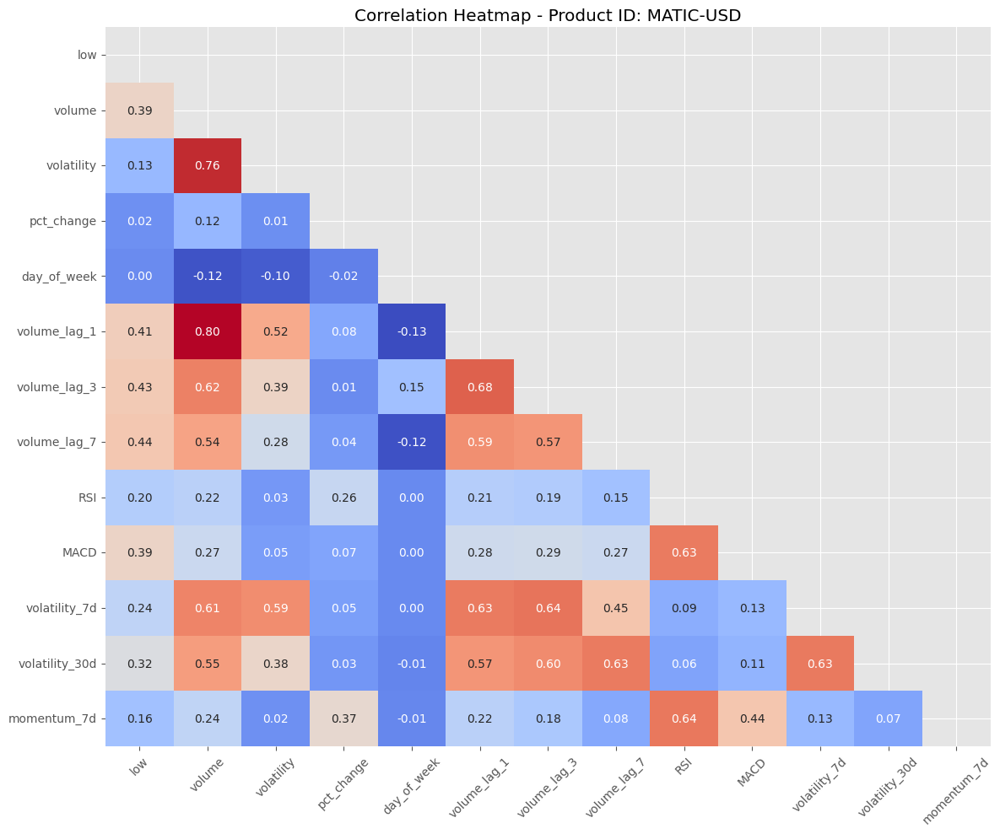

Features to drop due to high correlation in SOL-USD (>0.8): ['Signal_Line', 'momentum_1d', 'close', 'RSI_14']


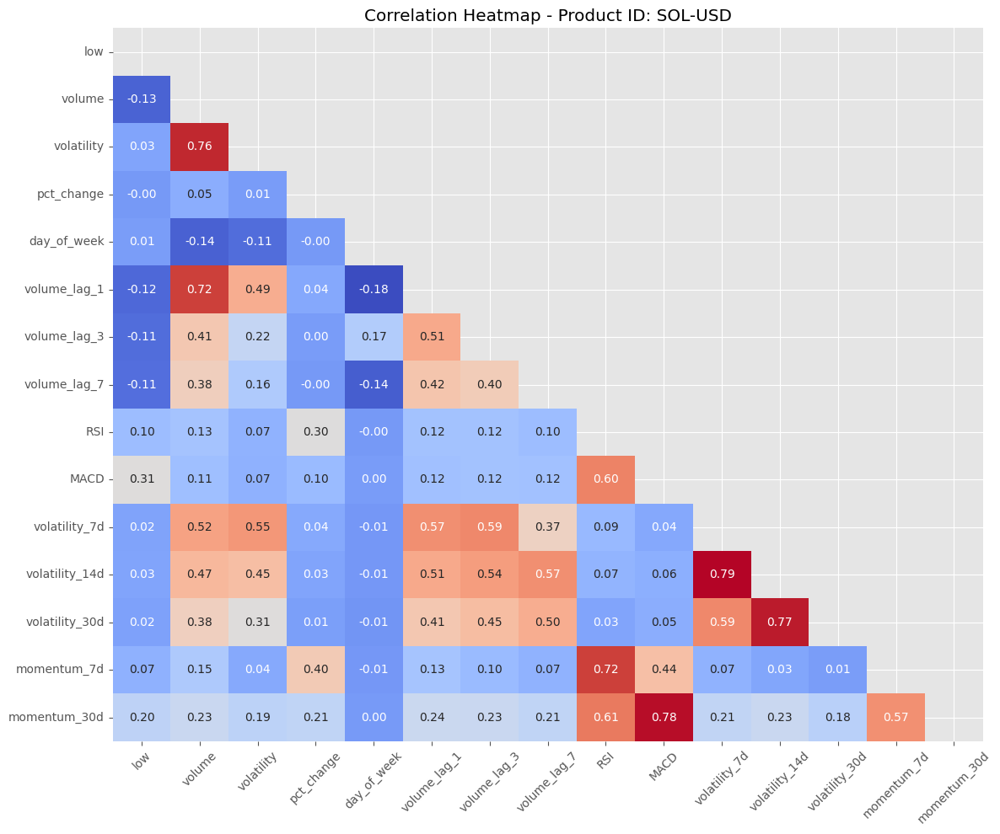

Features to drop due to high correlation in UNI-USD (>0.8): ['RSI_14', 'momentum_30d', 'close', 'momentum_1d', 'Signal_Line']


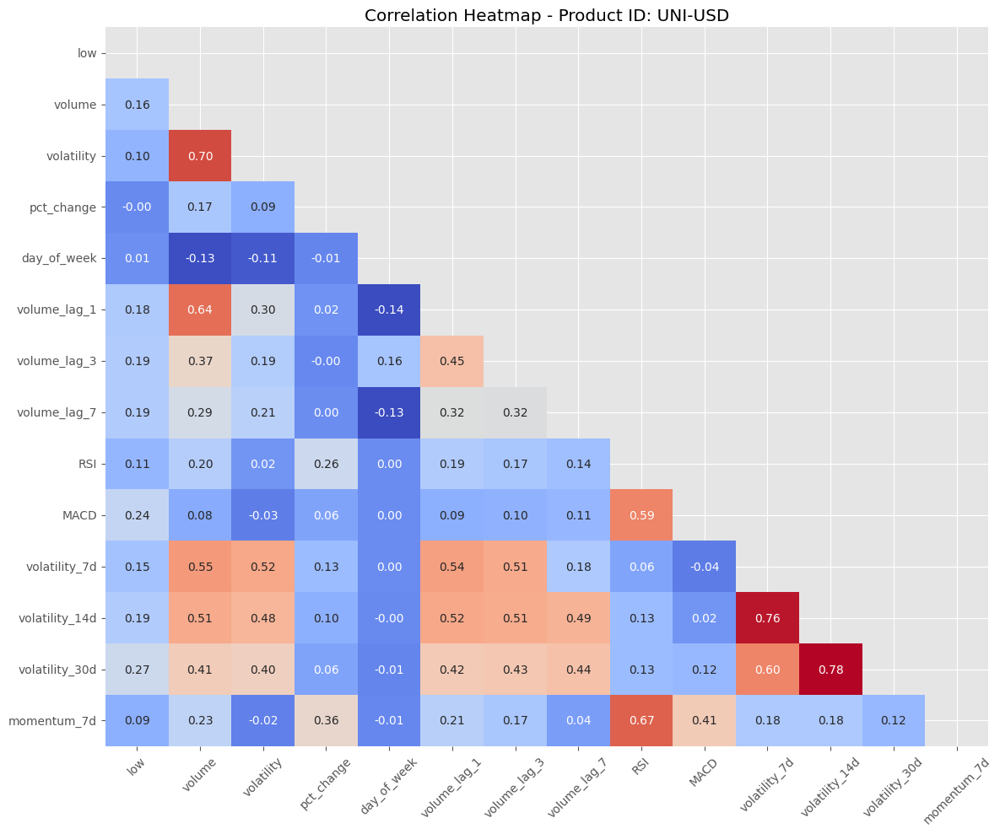

In [19]:
# Function to filter out highly correlated features
def filter_high_correlation(corr_matrix, threshold=0.80):
    to_drop = set()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                to_drop.add(corr_matrix.columns[i])
    return list(to_drop)

# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group and plot correlation matrix
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break

    # Initial computation of correlations
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Filter out highly correlated features and drop them
    high_corr_features = filter_high_correlation(corr, threshold=0.80)
    print(f"Features to drop due to high correlation in {product_id} (>{0.80}): {high_corr_features}")

    # Drop the highly correlated features
    group = group.drop(columns=high_corr_features)

    # Recompute correlations after dropping
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Initialize a figure with larger size
    plt.figure(figsize=(12, 10))

    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)

    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)

    # Show plot
    plt.tight_layout()
    plt.show()


In [20]:
df.dtypes

time              datetime64[ns]
product_id                object
low                      float64
close                    float64
volume                   float64
volatility               float64
pct_change               float64
day_of_week                int64
day_name                  object
volume_lag_1             float64
volume_lag_3             float64
volume_lag_7             float64
RSI                      float64
MACD                     float64
Signal_Line              float64
volatility_7d            float64
volatility_14d           float64
volatility_30d           float64
momentum_1d              float64
momentum_7d              float64
momentum_30d             float64
RSI_14                   float64
dtype: object

In [21]:
df.isnull().sum()

time                0
product_id          0
low                 0
close               0
volume              0
volatility          0
pct_change         10
day_of_week         0
day_name            0
volume_lag_1       10
volume_lag_3       30
volume_lag_7       70
RSI               130
MACD                0
Signal_Line         0
volatility_7d      70
volatility_14d    140
volatility_30d    300
momentum_1d        10
momentum_7d        70
momentum_30d      300
RSI_14            130
dtype: int64

## Handling Missing Values

In [22]:
# Handle missing values in numerical columns
def impute_numerical(group):
    # Forward fill
    group = group.ffill()
    # Backward fill
    group = group.bfill()
    # Linear interpolation
    group = group.interpolate(method='linear')
    return group

# Handle missing values in categorical columns
def impute_categorical(group):
    # Forward fill for categorical columns
    return group.ffill()

# Group by 'product_id' and apply imputation functions
for product_id, group in df.groupby('product_id'):
    # Impute numerical columns
    df.loc[group.index, group.select_dtypes(include=['float64', 'int64']).columns] = impute_numerical(
        group.select_dtypes(include=['float64', 'int64'])
    )
    # Impute categorical columns
    df.loc[group.index, group.select_dtypes(include=['object']).columns] = impute_categorical(
        group.select_dtypes(include=['object'])
    )

# Validate after imputation
print("Null values after imputation:")
print(df.isnull().sum())


Null values after imputation:
time              0
product_id        0
low               0
close             0
volume            0
volatility        0
pct_change        0
day_of_week       0
day_name          0
volume_lag_1      0
volume_lag_3      0
volume_lag_7      0
RSI               0
MACD              0
Signal_Line       0
volatility_7d     0
volatility_14d    0
volatility_30d    0
momentum_1d       0
momentum_7d       0
momentum_30d      0
RSI_14            0
dtype: int64


## Split the Dataset into Training and Testing Sets

In [23]:
# ## Split the Dataset into Training and Testing Sets
df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)
df.sort_index(inplace=True)

In [24]:
# Recalculate the correct split
total_length = len(df)
test_length = int(total_length * 0.2)
train_length = total_length - test_length

# Redefine the split date based on the recalculated lengths
split_index = df.index[train_length]
split_date = split_index.strftime('%Y-%m-%d')

# Split the dataset into training and testing sets
train = df[df.index < split_date]
test = df[df.index >= split_date]

# Adjust to ensure the split is clean without overlap
train_end_date = train.index.max()
test_start_date = test.index.min()

if train_end_date >= test_start_date:
    test = df[df.index > split_date]
    train = df[df.index <= split_date]

# Confirm there are no null values in the final sets
print("Null values in training set after additional imputation:", train.isnull().sum().sum())
print("Null values in testing set:", test.isnull().sum().sum())

# Verify the lengths
print(f"Train set length: {len(train)}")
print(f"Test set length: {len(test)}")
print(f"Combined length: {len(train) + len(test)}")

# Ensure the split proportions
print(f"Train set proportion: {len(train) / len(df):.2f}")
print(f"Test set proportion: {len(test) / len(df):.2f}")

# Print detailed information about the DataFrames
print("Training and Test set sizes:", train.shape, test.shape)
print("\nTraining data range: {} to {}".format(train.index.min(), train.index.max()))
print("Testing data range: {} to {}".format(test.index.min(), test.index.max()))

# Print full information on a few rows to understand the dataset structure better
print("\nDetailed sample of Training Set:")
print(train.head())

print("\nDetailed sample of Testing Set:")
print(test.head())

# Final verification of no overlap
overlap = train.index.intersection(test.index)
assert len(overlap) == 0, "Overlap detected between training and testing sets!"

Null values in training set after additional imputation: 0
Null values in testing set: 0
Train set length: 8604
Test set length: 2160
Combined length: 10764
Train set proportion: 0.80
Test set proportion: 0.20
Training and Test set sizes: (8604, 21) (2160, 21)

Training data range: 2021-07-16 00:00:00 to 2023-12-04 00:00:00
Testing data range: 2023-12-05 00:00:00 to 2024-07-08 00:00:00

Detailed sample of Training Set:
           product_id         low       close        volume  volatility  \
time                                                                      
2021-07-16    ADA-USD     1.16610     1.17140  3.676491e+07    6.783295   
2021-07-16   COMP-USD   367.10000   367.89000  2.381554e+04   11.822392   
2021-07-16    ETH-USD  1850.15000  1877.22000  1.842217e+05    6.226522   
2021-07-16   LINK-USD    15.13583    15.23963  2.246281e+06    7.919420   
2021-07-16    LTC-USD   120.44000   120.68000  1.305546e+05    6.127532   

            pct_change  day_of_week  day_name  volu

### Scaling the Data

In [25]:
# Initialize the scaler
scaler = StandardScaler()

# Drop non-numeric columns for scaling
train_numeric = train.drop(columns=['product_id', 'day_name'])
test_numeric = test.drop(columns=['product_id', 'day_name'])

# Fit the scaler on the training data and transform the training data
train_scaled_numeric = scaler.fit_transform(train_numeric)

# Transform the test data using the same scaler
test_scaled_numeric = scaler.transform(test_numeric)

# Convert the scaled data back to DataFrame
train_scaled = pd.DataFrame(train_scaled_numeric, index=train.index, columns=train_numeric.columns)
test_scaled = pd.DataFrame(test_scaled_numeric, index=test.index, columns=test_numeric.columns)

# Add back the 'product_id' and 'day_name' columns
train_scaled['product_id'] = train['product_id']
train_scaled['day_name'] = train['day_name']
test_scaled['product_id'] = test['product_id']
test_scaled['day_name'] = test['day_name']

# Print sample to verify
print("Sample of scaled training set:")
print(train_scaled.head())
print("\nSample of scaled testing set:")
print(test_scaled.head())

Sample of scaled training set:
                 low     close    volume  volatility  pct_change  day_of_week  \
time                                                                            
2021-07-16 -0.338398 -0.338220  0.809670   -0.118193    0.014166     0.001221   
2021-07-16 -0.302311 -0.302940 -0.383571    0.801388    0.606694     0.001221   
2021-07-16 -0.156057 -0.157738 -0.378362   -0.219798    0.233978     0.001221   
2021-07-16 -0.337020 -0.336866 -0.311392    0.089137    0.148822     0.001221   
2021-07-16 -0.326636 -0.326723 -0.380105   -0.237863   -0.127091     0.001221   

            volume_lag_1  volume_lag_3  volume_lag_7       RSI      MACD  \
time                                                                       
2021-07-16      0.809654      0.809162      0.808127  0.901640 -0.009171   
2021-07-16     -0.383573     -0.383800     -0.384282  0.523822 -0.009171   
2021-07-16     -0.378363     -0.378592     -0.379076  2.027508 -0.009171   
2021-07-16     -0.311

In [26]:
# # Choose the scaler
# scaler = StandardScaler()  # You can also use MinMaxScaler() or RobustScaler()

# # Fit the scaler on the training data
# numerical_columns = train.select_dtypes(include=['float64', 'int64']).columns
# scaler.fit(train[numerical_columns])

# # Transform the training and testing data
# train[numerical_columns] = scaler.transform(train[numerical_columns])
# test[numerical_columns] = scaler.transform(test[numerical_columns])

# # Validate the scaling process
# print("\nTraining and Test set sizes after scaling:", train.shape, test.shape)
# print("\nTraining data range after scaling: {} to {}".format(train.index.min(), train.index.max()))
# print("Testing data range after scaling: {} to {}".format(test.index.min(), test.index.max()))

# # Print full information on a few rows to understand the dataset structure better
# print("\nDetailed sample of Training Set after scaling:")
# print(train.head())
# print(train.tail())

# print("\nDetailed sample of Testing Set after scaling:")
# print(test.head())
# print(test.tail())


In [27]:
# Initialize the time series cross-validator
tscv = TimeSeriesSplit(n_splits=5)

# Example of using time series cross-validation
for train_index, val_index in tscv.split(train_scaled):
    train_cv = train_scaled.iloc[train_index]
    val_cv = train_scaled.iloc[val_index]
    
    print("TRAIN indices:", train_index, "VALIDATION indices:", val_index)
    print("Train CV set size:", train_cv.shape)
    print("Validation CV set size:", val_cv.shape)
    print("\nSample of Train CV set:")
    print(train_cv.head())
    print("\nSample of Validation CV set:")
    print(val_cv.head())

TRAIN indices: [   0    1    2 ... 1431 1432 1433] VALIDATION indices: [1434 1435 1436 ... 2865 2866 2867]
Train CV set size: (1434, 21)
Validation CV set size: (1434, 21)

Sample of Train CV set:
                 low     close    volume  volatility  pct_change  day_of_week  \
time                                                                            
2021-07-16 -0.338398 -0.338220  0.809670   -0.118193    0.014166     0.001221   
2021-07-16 -0.302311 -0.302940 -0.383571    0.801388    0.606694     0.001221   
2021-07-16 -0.156057 -0.157738 -0.378362   -0.219798    0.233978     0.001221   
2021-07-16 -0.337020 -0.336866 -0.311392    0.089137    0.148822     0.001221   
2021-07-16 -0.326636 -0.326723 -0.380105   -0.237863   -0.127091     0.001221   

            volume_lag_1  volume_lag_3  volume_lag_7       RSI      MACD  \
time                                                                       
2021-07-16      0.809654      0.809162      0.808127  0.901640 -0.009171   
2021-07

#### Data Splitting and Scaling
- Data Splitting:

The dataset was split into training and testing sets based on time, with 80% allocated for training and 20% for testing. This approach ensures no data leakage by maintaining the temporal order of the data.
- Scaling:

Feature scaling was applied to normalize the dataset, using StandardScaler from sklearn. The scaler was fitted on the training set and then used to transform both the training and testing sets. This step is crucial for time series models to ensure features are on a similar scale, improving model performance.

#### Verification
The output of the cross-validation indicates that the training and validation sets are correctly formed, with no overlap and consistent sizes:

Training Set: The training set indices range from 0 to 1433 in the first split, with subsequent splits expanding this window.
Validation Set: The validation set indices range from 1434 to 2867 in the first split, ensuring each validation set follows its respective training set without overlap.
Feature Integrity: All features, including newly engineered ones, are appropriately scaled and included in both training and validation sets.
This preprocessing pipeline ensures the data is well-prepared for time series forecasting, maintaining data integrity and avoiding leakage, thus setting a solid foundation for model training and evaluation.

The data splitting and scaling process was performed correctly. The time series cross-validation using TimeSeriesSplit was executed properly, maintaining temporal order and avoiding data leakage. The chosen approach is optimal for the project goals, allowing for robust model evaluation and accurate forecasting.

The verification outputs confirm that the dataset is correctly preprocessed, with no overlap between training and testing sets, and that the scaling was applied appropriately. The data is now ready for time series modeling, targeting the forecast of pct_change for the next 7 days.

### Modeling

### ARIMA (AutoRegressive Integrated Moving Average)
Overview:

ARIMA is a widely used statistical model for time series forecasting. It captures various time series dynamics including trend and seasonality.

In [52]:

# # Function to perform time series forecasting and plotting
# def interactive_plot(product_id):
#     train_product = train_scaled[train_scaled['product_id'] == product_id]
#     test_product = test_scaled[test_scaled['product_id'] == product_id]
    
#     # Fit the ARIMA model
#     model = ARIMA(train_product['pct_change'], order=(5, 1, 0))
#     model_fit = model.fit()
    
#     # Make predictions
#     predictions = model_fit.forecast(steps=len(test_product))
    
#     # Create a DataFrame for visualization
#     prediction_df = pd.DataFrame(predictions, index=test_product.index, columns=['Forecast'])
    
#     # Create interactive plot with Plotly
#     fig = go.Figure()
#     fig.add_trace(go.Scatter(x=train_product.index, y=train_product['pct_change'], mode='lines', name='Training Data'))
#     fig.add_trace(go.Scatter(x=test_product.index, y=test_product['pct_change'], mode='lines', name='Test Data'))
#     fig.add_trace(go.Scatter(x=prediction_df.index, y=prediction_df['Forecast'], mode='lines', name='Forecast', line=dict(color='red')))
    
#     fig.update_layout(title=f'Percentage Change Forecast for {product_id}', xaxis_title='Date', yaxis_title='Percentage Change')
#     fig.show()
    
#     # Calculate and print evaluation metrics
#     mae = mean_absolute_error(test_product['pct_change'], predictions)
#     mse = mean_squared_error(test_product['pct_change'], predictions)
#     rmse = np.sqrt(mse)
#     mape = np.mean(np.abs((test_product['pct_change'] - predictions) / test_product['pct_change'])) * 100

#     print(f"Final Test Metrics for {product_id}:")
#     print(f"MAE: {mae}")
#     print(f"MSE: {mse}")
#     print(f"RMSE: {rmse}")
#     print(f"MAPE: {mape}")

# # Create a dropdown for selecting the product_id
# product_id_dropdown = widgets.Dropdown(
#     options=df['product_id'].unique(),
#     description='Product ID:',
# )

# # Create an interactive widget
# interactive_widget = widgets.interactive(interactive_plot, product_id=product_id_dropdown)

# # Display the interactive widget
# display(interactive_widget)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

In [56]:
# # Function to calculate evaluation metrics
# def calculate_metrics(actual, predicted):
#     mae = mean_absolute_error(actual, predicted)
#     mse = mean_squared_error(actual, predicted)
#     rmse = np.sqrt(mse)
#     mape = np.mean(np.abs((actual - predicted) / actual)) * 100 if np.all(actual != 0) else np.nan
#     return {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}

# # Function to create interactive plot
# def interactive_plot(product_id, recent_window='2023-10-01'):
#     split_date = '2023-12-05'
    
#     # Filter based on product_id first, then by date
#     product_data = df[df['product_id'] == product_id]
#     train = product_data[product_data.index < split_date]
#     test = product_data[product_data.index >= split_date]
    
#     model = ARIMA(train['pct_change'], order=(5, 1, 0))
#     model_fit = model.fit()
    
#     # Forecast for the next 7 days beyond the last date in test set
#     forecast_steps = 7
#     forecast_start = test.index.max() + pd.Timedelta(days=1)
#     forecast_end = forecast_start + pd.Timedelta(days=forecast_steps - 1)
#     forecast_index = pd.date_range(start=forecast_start, end=forecast_end, freq='D')
#     forecast = model_fit.forecast(steps=forecast_steps)
    
#     plt.figure(figsize=(12, 6))
#     plt.plot(train[train.index >= recent_window].index, train[train.index >= recent_window]['pct_change'], label='Train Data')
#     plt.plot(test.index, test['pct_change'], label='Test Data', color='orange')
#     plt.plot(forecast_index, forecast, label='Forecast', color='red')
#     plt.title(f'{product_id} - ARIMA Forecast')
#     plt.xlabel('Date')
#     plt.ylabel('Percentage Change')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
    
#     # Calculate and display metrics for the initial part of the test set that matches forecast steps
#     actual = test['pct_change'].iloc[:forecast_steps]
#     predicted = forecast[:forecast_steps]
#     metrics = calculate_metrics(actual, predicted)
#     print(f"Metrics for {product_id}: {metrics}")

# # Create dropdown for product IDs
# product_ids = df['product_id'].unique()
# dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# # Create slider for recent window start date
# date_slider = widgets.SelectionSlider(
#     options=pd.date_range(start='2023-01-01', end='2023-12-01', freq='MS').strftime('%Y-%m-%d').tolist(),
#     value='2023-10-01',
#     description='Recent Window Start:',
#     continuous_update=False
# )

# # Display the interactive plot with dropdown and slider
# widgets.interact(interactive_plot, product_id=dropdown, recent_window=date_slider)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.interactive_plot(product_id, recent_window='2023-10-01')>

Using Prophet

In [63]:
# # Function to prepare data for Prophet
# def prepare_data(df, product_id):
#     product_data = df[df['product_id'] == product_id][['pct_change']].reset_index()
#     product_data.rename(columns={'time': 'ds', 'pct_change': 'y'}, inplace=True)
#     return product_data

# # Function to plot forecast using Prophet
# def prophet_forecast(product_id, recent_window):
#     data = prepare_data(df, product_id)
#     train_data = data[data['ds'] < '2023-12-05']
#     test_data = data[data['ds'] >= '2023-12-05']
    
#     model = Prophet()
#     model.fit(train_data)
    
#     # Make future dataframe for 7 days forecast
#     future = model.make_future_dataframe(periods=7)
#     forecast = model.predict(future)
    
#     plt.figure(figsize=(12, 6))
#     plt.plot(train_data[train_data['ds'] >= recent_window]['ds'], train_data[train_data['ds'] >= recent_window]['y'], label='Train Data')
#     plt.plot(test_data['ds'], test_data['y'], label='Test Data', color='orange')
#     plt.plot(forecast['ds'], forecast['yhat'], label='Forecast', color='red')
#     plt.title(f'{product_id} - Prophet Forecast')
#     plt.xlabel('Date')
#     plt.ylabel('Percentage Change')
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# # Create dropdown for product IDs
# product_ids = df['product_id'].unique()
# dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# # Create slider for recent window start date
# date_slider = widgets.SelectionSlider(
#     options=pd.date_range(start='2023-01-01', end='2023-12-01', freq='MS').strftime('%Y-%m-%d').tolist(),
#     value='2023-10-01',
#     description='Recent Window Start:',
#     continuous_update=False
# )

# # Display the interactive plot with dropdown and slider
# interact(prophet_forecast, product_id=dropdown, recent_window=date_slider)

interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.prophet_forecast(product_id, recent_window)>

In [64]:
# # Function to prepare data for Prophet
# def prepare_prophet_data(df, product_id):
#     product_data = df[df['product_id'] == product_id][['pct_change']].reset_index()
#     product_data.rename(columns={'time': 'ds', 'pct_change': 'y'}, inplace=True)
#     return product_data

# # Function to fit and forecast using Prophet
# def prophet_forecast(product_id, recent_window):
#     product_data = prepare_prophet_data(df, product_id)
    
#     # Split the data into training and testing sets
#     split_date = '2023-12-05'
#     train_data = product_data[product_data['ds'] < split_date]
#     test_data = product_data[product_data['ds'] >= split_date]
    
#     # Fit the Prophet model
#     model = Prophet()
#     model.fit(train_data)
    
#     # Make future dataframe for 7 days forecast
#     future = model.make_future_dataframe(periods=7)
#     forecast = model.predict(future)
    
#     # Plot the forecast
#     plt.figure(figsize=(12, 6))
#     plt.plot(train_data[train_data['ds'] >= recent_window]['ds'], train_data[train_data['ds'] >= recent_window]['y'], label='Train Data')
#     plt.plot(test_data['ds'], test_data['y'], label='Test Data', color='orange')
#     plt.plot(forecast['ds'], forecast['yhat'], label='Forecast', color='red')
#     plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], color='lightcoral', alpha=0.3)
#     plt.title(f'{product_id} - Prophet Forecast')
#     plt.xlabel('Date')
#     plt.ylabel('Percentage Change')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
    
#     # Calculate and display metrics for the initial part of the test set that matches forecast steps
#     actual = test_data['y'].iloc[:7]
#     predicted = forecast['yhat'].iloc[-7:]
#     metrics = calculate_metrics(actual, predicted)
#     print(f"Metrics for {product_id}: {metrics}")

# # Create dropdown for product IDs
# product_ids = df['product_id'].unique()
# dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# # Create slider for recent window start date
# date_slider = widgets.SelectionSlider(
#     options=pd.date_range(start='2023-01-01', end='2023-12-01', freq='MS').strftime('%Y-%m-%d').tolist(),
#     value='2023-10-01',
#     description='Recent Window Start:',
#     continuous_update=False
# )

# # Display the interactive plot with dropdown and slider
# interact(prophet_forecast, product_id=dropdown, recent_window=date_slider)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.prophet_forecast(product_id, recent_window)>

01:55:41 - cmdstanpy - INFO - Chain [1] start processing
01:55:41 - cmdstanpy - INFO - Chain [1] done processing


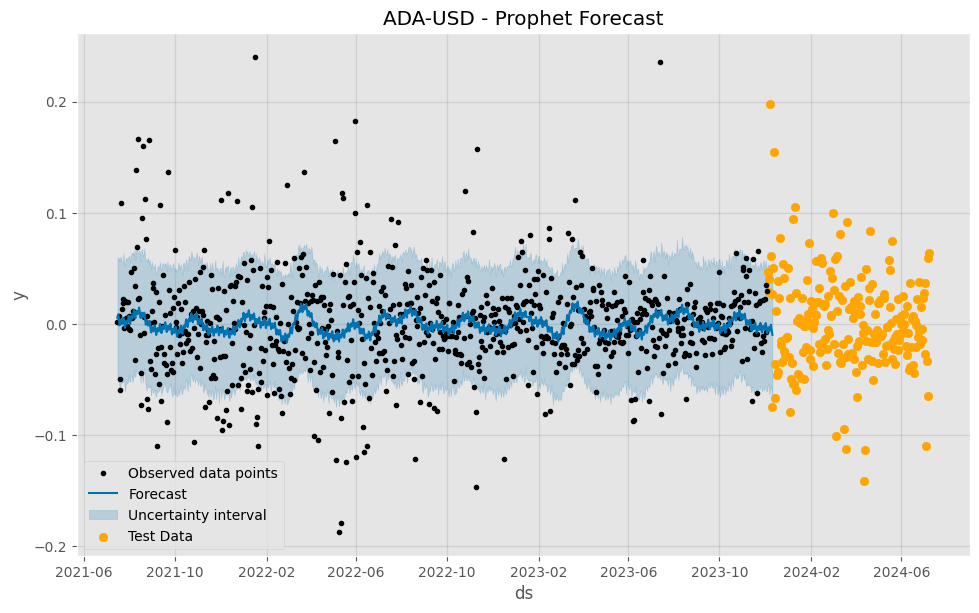

In [77]:


# # Ensure 'ds' and 'y' columns are correctly set for Prophet
# df['ds'] = df.index
# df['y'] = df['pct_change']

# def plot_prophet_forecast(product_id):
#     # Filter the data for the given product_id
#     df_filtered = df[df['product_id'] == product_id][['ds', 'y']].copy()
    
#     # Split the data
#     split_date = '2023-12-05'
#     train_data = df_filtered[df_filtered['ds'] < split_date]
#     test_data = df_filtered[df_filtered['ds'] >= split_date]
    
#     # Initialize and fit the model
#     model = Prophet()
#     model.fit(train_data)
    
#     # Make future dataframe for 7 days forecast
#     future = model.make_future_dataframe(periods=7)
#     forecast = model.predict(future)
    
#     # Plot the forecast
#     fig = model.plot(forecast)
#     plt.scatter(test_data['ds'], test_data['y'], color='orange', label='Test Data')
#     plt.title(f'{product_id} - Prophet Forecast')
#     plt.legend()
#     plt.show()

# # Example usage for one product_id
# plot_prophet_forecast('ADA-USD')


In [78]:

# # Function to calculate evaluation metrics
# def calculate_metrics(actual, predicted):
#     mae = np.mean(np.abs(actual - predicted))
#     mse = np.mean((actual - predicted) ** 2)
#     rmse = np.sqrt(mse)
#     mape = np.mean(np.abs((actual - predicted) / actual)) * 100 if np.all(actual != 0) else np.nan
#     return {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}

# # Function to create Prophet forecast plot
# def plot_prophet_forecast(product_id):
#     # Filter the data for the given product_id
#     df_filtered = df[df['product_id'] == product_id][['ds', 'y']].copy()
    
#     # Split the data
#     split_date = '2023-12-05'
#     train = df_filtered[df_filtered['ds'] < split_date]
#     test = df_filtered[df_filtered['ds'] >= split_date]

#     # Fit the Prophet model
#     model = Prophet()
#     model.fit(train)
    
#     # Make future dataframe for 7 days forecast
#     future = model.make_future_dataframe(periods=7)
#     forecast = model.predict(future)
    
#     # Plot the forecast
#     plt.figure(figsize=(12, 6))
#     model.plot(forecast)
#     plt.scatter(test['ds'], test['y'], color='orange', label='Test Data')
#     plt.legend()
#     plt.title(f'{product_id} - Prophet Forecast')
#     plt.xlabel('Date')
#     plt.ylabel('Percentage Change')
#     plt.grid(True)
#     plt.show()
    
#     # Calculate and display metrics for the initial part of the test set that matches forecast steps
#     actual = test['y'].values
#     predicted = forecast['yhat'][-len(test):].values
#     metrics = calculate_metrics(actual, predicted)
#     print(f"Metrics for {product_id}: {metrics}")

# # Create dropdown for product IDs
# product_ids = df['product_id'].unique()
# dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# # Display the interactive plot with dropdown
# interact(plot_prophet_forecast, product_id=dropdown)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.plot_prophet_forecast(product_id)>

In [79]:
# # Function to calculate evaluation metrics
# def calculate_metrics(actual, predicted):
#     mae = np.mean(np.abs(actual - predicted))
#     mse = np.mean((actual - predicted) ** 2)
#     rmse = np.sqrt(mse)
#     mape = np.mean(np.abs((actual - predicted) / actual)) * 100 if np.all(actual != 0) else np.nan
#     return {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}

# # Function to create Prophet forecast plot
# def plot_prophet_forecast(product_id):
#     plt.close('all')  # Close all existing plots to avoid multiple plots issue

#     # Filter the data for the given product_id
#     df_filtered = df[df['product_id'] == product_id][['ds', 'y']].copy()
    
#     # Split the data
#     split_date = '2023-12-05'
#     train = df_filtered[df_filtered['ds'] < split_date]
#     test = df_filtered[df_filtered['ds'] >= split_date]

#     # Fit the Prophet model
#     model = Prophet()
#     model.fit(train)
    
#     # Make future dataframe for 7 days forecast
#     future = model.make_future_dataframe(periods=7)
#     forecast = model.predict(future)
    
#     # Plot the forecast
#     plt.figure(figsize=(12, 6))
#     model.plot(forecast)
#     plt.scatter(test['ds'], test['y'], color='orange', label='Test Data')
#     plt.legend()
#     plt.title(f'{product_id} - Prophet Forecast')
#     plt.xlabel('Date')
#     plt.ylabel('Percentage Change')
#     plt.grid(True)
#     plt.show()
    
#     # Calculate and display metrics for the initial part of the test set that matches forecast steps
#     actual = test['y'].values
#     predicted = forecast['yhat'][-len(test):].values
#     metrics = calculate_metrics(actual, predicted)
#     print(f"Metrics for {product_id}: {metrics}")

# # Create dropdown for product IDs
# product_ids = df['product_id'].unique()
# dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# # Display the interactive plot with dropdown
# interact(plot_prophet_forecast, product_id=dropdown)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.plot_prophet_forecast(product_id)>

In [80]:
# # Function to calculate evaluation metrics
# def calculate_metrics(actual, predicted):
#     mae = np.mean(np.abs(actual - predicted))
#     mse = np.mean((actual - predicted) ** 2)
#     rmse = np.sqrt(mse)
#     mape = np.mean(np.abs((actual - predicted) / actual)) * 100 if np.all(actual != 0) else np.nan
#     return {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}

# # Function to create Prophet forecast plot
# def plot_prophet_forecast(product_id):
#     plt.close('all')  # Close all existing plots to avoid multiple plots issue

#     # Filter the data for the given product_id
#     df_filtered = df[df['product_id'] == product_id][['ds', 'y']].copy()
    
#     # Split the data
#     split_date = '2023-12-05'
#     train = df_filtered[df_filtered['ds'] < split_date]
#     test = df_filtered[df_filtered['ds'] >= split_date]

#     # Fit the Prophet model
#     model = Prophet()
#     model.fit(train)
    
#     # Make future dataframe for 7 days forecast
#     future = model.make_future_dataframe(periods=7)
#     forecast = model.predict(future)
    
#     # Plot the forecast
#     fig, ax = plt.subplots(figsize=(12, 6))
#     model.plot(forecast, ax=ax)
#     ax.scatter(test['ds'], test['y'], color='orange', label='Test Data')
#     ax.legend()
#     ax.set_title(f'{product_id} - Prophet Forecast')
#     ax.set_xlabel('Date')
#     ax.set_ylabel('Percentage Change')
#     ax.grid(True)
#     plt.show()
    
#     # Calculate and display metrics for the initial part of the test set that matches forecast steps
#     actual = test['y'].values
#     predicted = forecast['yhat'][-len(test):].values
#     metrics = calculate_metrics(actual, predicted)
#     print(f"Metrics for {product_id}: {metrics}")

# # Create dropdown for product IDs
# product_ids = df['product_id'].unique()
# dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# # Display the interactive plot with dropdown
# interact(plot_prophet_forecast, product_id=dropdown)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.plot_prophet_forecast(product_id)>

In [30]:
# Ensure 'ds' and 'y' columns are correctly set for Prophet
df_prophet = df.copy()
df_prophet['ds'] = df_prophet.index
df_prophet['y'] = df_prophet['pct_change']

# Function to calculate evaluation metrics
def calculate_metrics(actual, predicted):
    mae = np.mean(np.abs(actual - predicted))
    mse = np.mean((actual - predicted) ** 2)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100 if np.all(actual != 0) else np.nan
    return {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}

# Function to create Prophet forecast plot
def plot_prophet_forecast(product_id):
    plt.close('all')  # Close all existing plots to avoid multiple plots issue

    # Filter the data for the given product_id
    df_filtered = df_prophet[df_prophet['product_id'] == product_id][['ds', 'y']].copy()
    
    # Split the data
    split_date = '2023-12-05'
    train = df_filtered[df_filtered['ds'] < split_date]
    test = df_filtered[df_filtered['ds'] >= split_date]

    # Fit the Prophet model
    model = Prophet()
    model.fit(train)
    
    # Make future dataframe for 7 days forecast
    future = model.make_future_dataframe(periods=7)
    forecast = model.predict(future)
    
    # Plot the forecast
    fig, ax = plt.subplots(figsize=(12, 6))
    model.plot(forecast, ax=ax)
    ax.scatter(test['ds'], test['y'], color='orange', label='Test Data')
    ax.legend()
    ax.set_title(f'{product_id} - Prophet Forecast')
    ax.set_xlabel('Date')
    ax.set_ylabel('Percentage Change')
    ax.grid(True)
    plt.show()
    
    # Calculate and display metrics for the initial part of the test set that matches forecast steps
    actual = test['y'].values
    predicted = forecast['yhat'][-len(test):].values
    metrics = calculate_metrics(actual, predicted)
    print(f"Metrics for {product_id}: {metrics}")

# Create dropdown for product IDs
product_ids = df['product_id'].unique()
dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# Display the interactive plot with dropdown
interact(plot_prophet_forecast, product_id=dropdown)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.plot_prophet_forecast(product_id)>

In [31]:

# Ensure 'ds' and 'y' columns are correctly set for Prophet
df_prophet = df.copy()
df_prophet['ds'] = df_prophet.index
df_prophet['y'] = df_prophet['pct_change']

# Function to calculate evaluation metrics
def calculate_metrics(actual, predicted):
    mae = np.mean(np.abs(actual - predicted))
    mse = np.mean((actual - predicted) ** 2)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100 if np.all(actual != 0) else np.nan
    return {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}

# Function to create Prophet forecast plot
def plot_prophet_forecast(product_id):
    plt.close('all')  # Close all existing plots to avoid multiple plots issue

    # Filter the data for the given product_id
    df_filtered = df_prophet[df_prophet['product_id'] == product_id][['ds', 'y']].copy()
    
    # Split the data
    split_date = '2023-12-05'
    train = df_filtered[df_filtered['ds'] < split_date]
    test = df_filtered[df_filtered['ds'] >= split_date]

    # Fit the Prophet model
    model = Prophet()
    model.fit(train)
    
    # Make future dataframe for 7 days forecast
    future = model.make_future_dataframe(periods=7)
    forecast = model.predict(future)
    
    # Plot the forecast
    fig, ax = plt.subplots(figsize=(12, 6))
    model.plot(forecast, ax=ax)
    ax.scatter(test['ds'], test['y'], color='orange', label='Test Data')
    ax.legend()
    ax.set_title(f'{product_id} - Prophet Forecast')
    ax.set_xlabel('Date')
    ax.set_ylabel('Percentage Change')
    ax.grid(True)
    plt.show()
    
    # Calculate and display metrics for the initial part of the test set that matches forecast steps
    actual = test['y'].values
    predicted = forecast['yhat'][-len(test):].values
    metrics = calculate_metrics(actual, predicted)
    print(f"Metrics for {product_id}: {metrics}")

# Create dropdown for product IDs
product_ids = df['product_id'].unique()
dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# Display the interactive plot with dropdown
interact(plot_prophet_forecast, product_id=dropdown)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.plot_prophet_forecast(product_id)>

In [39]:
# Function to calculate evaluation metrics
def calculate_metrics(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    r2 = r2_score(actual, predicted)
    medae = median_absolute_error(actual, predicted)
    
    # Safe sMAPE calculation
    if np.all((actual + predicted) != 0):
        smape = np.mean(np.abs(predicted - actual) / (np.abs(predicted) + np.abs(actual))) * 200
    else:
        smape = np.nan
        
    # Safe MAPE calculation
    if np.all(actual != 0):
        mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    else:
        mape = np.nan
    
    return {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R²': r2,
        'MedAE': medae,
        'sMAPE': smape,
        'MAPE': mape
    }

# Ensure 'ds' and 'y' columns are correctly set for Prophet
df['ds'] = df.index
df['y'] = df['pct_change']

def plot_prophet_forecast(product_id):
    plt.close('all')  # Close all existing plots to avoid multiple plots issue

    # Filter the data for the given product_id
    df_filtered = df[df['product_id'] == product_id][['ds', 'y']].copy()

    # Split the data
    split_date = pd.Timestamp('2023-12-05')
    train_data = df_filtered[df_filtered['ds'] < split_date]
    test_data = df_filtered[df_filtered['ds'] >= split_date]

    # Fit the Prophet model
    model = Prophet()
    model.fit(train_data)

    # Make future dataframe for 7 days forecast
    future = model.make_future_dataframe(periods=7)
    forecast = model.predict(future)

    # Plot forecast along with train and test data
    plt.figure(figsize=(14, 7))
    plt.plot(train_data['ds'], train_data['y'], label='Train Data', color='blue')
    plt.plot(test_data['ds'], test_data['y'], label='Test Data', color='orange')
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast', color='red')
    plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], color='pink', alpha=0.5, label='Uncertainty interval')
    plt.title(f'Prophet Forecast for {product_id}')
    plt.xlabel('Date')
    plt.ylabel('Percentage Change')
    plt.legend()
    plt.xlim([pd.to_datetime('2023-11-01'), pd.to_datetime('2024-07-08')])  # Adjust the range to show recent and forecast period
    plt.grid(True)
    plt.show()

    # Calculate and display metrics for the initial part of the test set that matches forecast steps
    actual = test_data['y'].iloc[:7]
    predicted = forecast['yhat'].iloc[-7:]
    metrics = calculate_metrics(actual, predicted)
    print(f"Metrics for {product_id}: {metrics}")

# Create dropdown for product IDs
product_ids = df['product_id'].unique()
dropdown = widgets.Dropdown(options=product_ids, description='Product ID:')

# Display the interactive plot with dropdown
interact(plot_prophet_forecast, product_id=dropdown)


interactive(children=(Dropdown(description='Product ID:', options=('ADA-USD', 'COMP-USD', 'ETH-USD', 'LINK-USD…

<function __main__.plot_prophet_forecast(product_id)>

In [40]:
# Check for null values
print("Null values in each column:")
print(df.isnull().sum())

# Describe the dataset to check for any anomalies or outliers
print("\nDescriptive statistics:")
print(df.describe())

# Check for unique values in 'product_id' column
print("\nUnique product IDs:")
print(df['product_id'].unique())

Null values in each column:
product_id        0
low               0
close             0
volume            0
volatility        0
pct_change        0
day_of_week       0
day_name          0
volume_lag_1      0
volume_lag_3      0
volume_lag_7      0
RSI               0
MACD              0
Signal_Line       0
volatility_7d     0
volatility_14d    0
volatility_30d    0
momentum_1d       0
momentum_7d       0
momentum_30d      0
RSI_14            0
ds                0
y                 0
dtype: int64

Descriptive statistics:
               low         close        volume    volatility    pct_change  \
count  10764.00000  10764.000000  1.076400e+04  10764.000000  10764.000000   
mean    3938.10909   4034.363583  1.051009e+07      7.364042      0.000813   
min        0.23000      0.242100  1.821578e+03      0.421154     -0.425812   
25%        6.00950      6.192500  1.095763e+05      4.049046     -0.023357   
50%       31.30000     32.536160  6.184873e+05      6.022296     -0.000109   
75%   

In [41]:
# Ensure 'ds' and 'y' columns are correctly set for Prophet
df['ds'] = df.index
df['y'] = df['pct_change']

# Define the split date
split_date = pd.Timestamp('2023-12-05')

# Split the data into training and testing sets
train_data = df[df['ds'] < split_date]
test_data = df[df['ds'] >= split_date]

# Verify the split
print("\nTraining data range:")
print(train_data['ds'].min(), "to", train_data['ds'].max())

print("\nTesting data range:")
print(test_data['ds'].min(), "to", test_data['ds'].max())

# Check the number of records in each set
print("\nNumber of records in training set:", len(train_data))
print("Number of records in testing set:", len(test_data))



Training data range:
2021-07-16 00:00:00 to 2023-12-04 00:00:00

Testing data range:
2023-12-05 00:00:00 to 2024-07-08 00:00:00

Number of records in training set: 8604
Number of records in testing set: 2160


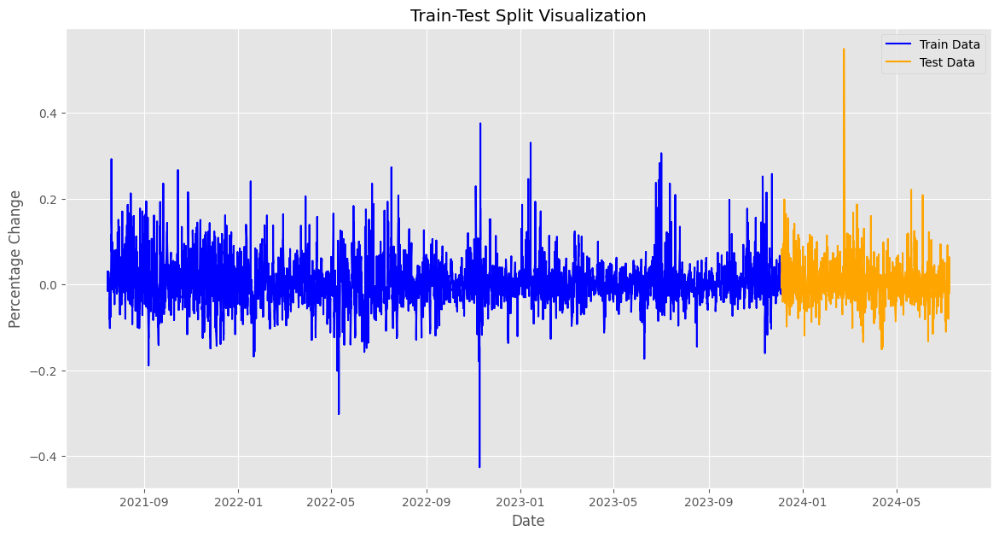

In [42]:
# Plot the data to visualize the split
plt.figure(figsize=(14, 7))
plt.plot(train_data['ds'], train_data['y'], label='Train Data', color='blue')
plt.plot(test_data['ds'], test_data['y'], label='Test Data', color='orange')
plt.title('Train-Test Split Visualization')
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.legend()
plt.show()

04:05:20 - cmdstanpy - INFO - Chain [1] start processing
04:05:20 - cmdstanpy - INFO - Chain [1] done processing


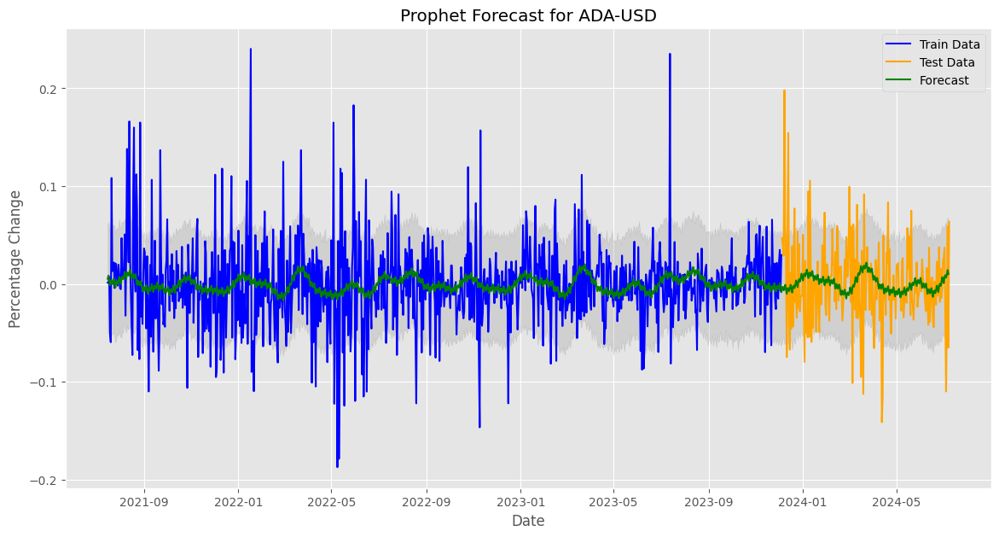

Metrics for ADA-USD: {'MAE': 0.06266000915163175, 'MSE': 0.007165972782893407, 'RMSE': 0.08465206898176444, 'R²': -0.30112706001542944, 'MedAE': 0.04581789061194342, 'sMAPE': nan}


In [43]:
def plot_prophet_forecast(product_id):
    # Filter the data for the given product_id
    df_filtered = df[df['product_id'] == product_id][['ds', 'y']].copy()

    # Split the data
    split_date = pd.Timestamp('2023-12-05')
    train_data = df_filtered[df_filtered['ds'] < split_date]
    test_data = df_filtered[df_filtered['ds'] >= split_date]

    # Initialize and fit the Prophet model
    model = Prophet()
    model.fit(train_data)

    # Create a DataFrame for future predictions
    future = model.make_future_dataframe(periods=len(test_data), freq='D')
    future['y'] = pd.concat([train_data['y'], test_data['y']], axis=0).values

    # Make the forecast
    forecast = model.predict(future)

    # Plot the results
    plt.figure(figsize=(14, 7))
    plt.plot(train_data['ds'], train_data['y'], label='Train Data', color='blue')
    plt.plot(test_data['ds'], test_data['y'], label='Test Data', color='orange')
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast', color='green')
    plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], color='grey', alpha=0.2)
    plt.title(f'Prophet Forecast for {product_id}')
    plt.xlabel('Date')
    plt.ylabel('Percentage Change')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate and display metrics for the initial part of the test set that matches forecast steps
    actual = test_data['y'].iloc[:7]
    predicted = forecast['yhat'].iloc[-7:]
    metrics = calculate_metrics(actual, predicted)
    print(f"Metrics for {product_id}: {metrics}")

def calculate_metrics(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    r2 = r2_score(actual, predicted)
    medae = median_absolute_error(actual, predicted)
    smape = np.mean(np.abs(predicted - actual) / (np.abs(predicted) + np.abs(actual))) * 200

    return {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R²': r2,
        'MedAE': medae,
        'sMAPE': smape
    }

# Example usage for one product_id
plot_prophet_forecast('ADA-USD')


## Model Training and Evaluation

In [24]:
X_train = train.drop(columns=['product_id', 'pct_change', 'day_name'])
y_train = train['pct_change']
X_test = test.drop(columns=['product_id', 'pct_change', 'day_name'])
y_test = test['pct_change']

In [25]:
# Adjust display settings for better visibility
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

# Check the distribution of product IDs in train and test sets
train_product_ids = train['product_id'].value_counts()
test_product_ids = test['product_id'].value_counts()

print("Train product ID distribution:")
print(train_product_ids)
print("\nTest product ID distribution:")
print(test_product_ids)


Train product ID distribution:
product_id
ADA-USD      868
COMP-USD     868
ETH-USD      868
LINK-USD     868
LTC-USD      868
MATIC-USD    868
SOL-USD      868
UNI-USD      868
BTC-USD      868
AVAX-USD     792
Name: count, dtype: int64

Test product ID distribution:
product_id
LINK-USD     216
LTC-USD      216
ADA-USD      216
ETH-USD      216
AVAX-USD     216
BTC-USD      216
SOL-USD      216
COMP-USD     216
MATIC-USD    216
UNI-USD      216
Name: count, dtype: int64


In [26]:
# Verify the time range of the datasets
train_start, train_end = train.index.min(), train.index.max()
test_start, test_end = test.index.min(), test.index.max()

print("\nTraining data range: {} to {}".format(train_start, train_end))
print("Testing data range: {} to {}".format(test_start, test_end))

# Verify the proportions
train_proportion = len(train) / len(df)
test_proportion = len(test) / len(df)

print("\nTrain set proportion: {:.2f}".format(train_proportion))
print("Test set proportion: {:.2f}".format(test_proportion))



Training data range: 2021-07-16 00:00:00 to 2023-12-04 00:00:00
Testing data range: 2023-12-05 00:00:00 to 2024-07-08 00:00:00

Train set proportion: 0.80
Test set proportion: 0.20


In [27]:
# Verify the lengths
print("\nTrain set length:", len(train))
print("Test set length:", len(test))
print("Combined length:", len(train) + len(test))
print("Original total length:", len(df))

# Check for data leakage (overlap) between train and test sets
overlap = train.index.intersection(test.index)
assert len(overlap) == 0, "Overlap detected between training and testing sets!"
print("\nNo overlap detected between training and testing sets.")



Train set length: 8604
Test set length: 2160
Combined length: 10764
Original total length: 10764

No overlap detected between training and testing sets.


In [28]:
# # Detailed sample of Training Set
# print("\nDetailed sample of Training Set:")
# print(train.head(10))  # Print more rows if necessary

# # Detailed sample of Testing Set
# print("\nDetailed sample of Testing Set:")
# print(test.head(10))  # Print more rows if necessary

# # Reset display settings to default
# pd.reset_option('display.max_rows')
# pd.reset_option('display.max_columns')
# pd.reset_option('display.expand_frame_repr')


In [29]:
print("\nDetailed sample of last few rows of Training Set:")
print(train.tail())

print("\nDetailed sample of last few rows of Testing Set:")
print(test.tail())



Detailed sample of last few rows of Training Set:
           product_id       low     close    volume  volatility  pct_change  day_of_week day_name  volume_lag_1  volume_lag_3  volume_lag_7       RSI      MACD  Signal_Line  volatility_7d  volatility_14d  volatility_30d  momentum_1d  momentum_7d  momentum_30d    RSI_14
time                                                                                                                                                                                                                                                                         
2023-12-04    BTC-USD  3.604551  3.700982 -0.383631   -0.248428    1.020935      1.50216   Sunday     -0.384114     -0.384041     -0.384617  1.390108  3.152602     2.725680      -1.026985       -0.933785       -1.168318     1.020935     0.961284      0.465530  2.085850
2023-12-04    UNI-USD -0.337933 -0.337745 -0.355770   -0.060107    0.149717      1.50216   Sunday     -0.368965     -0.362479     -0.350071

In [30]:
# Ensure no overlap between training and testing sets
for product_id in df['product_id'].unique():
    max_train_date = train[train['product_id'] == product_id].index.max()
    min_test_date = test[test['product_id'] == product_id].index.min()
    print(f"Product ID: {product_id} - Max train date: {max_train_date}, Min test date: {min_test_date}")
    assert max_train_date < min_test_date, f"Overlap detected for product_id {product_id}"


Product ID: ADA-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: COMP-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: ETH-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: LINK-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: LTC-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: MATIC-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: SOL-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: UNI-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: BTC-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: AVAX-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00


In [31]:
# Verify that the temporal continuity is maintained within each product ID
for product_id, group in df.groupby('product_id'):
    max_train_date = train[train['product_id'] == product_id].index.max()
    min_test_date = test[test['product_id'] == product_id].index.min()
    print(f"Product ID: {product_id}")
    print(f"  Train max date: {max_train_date}")
    print(f"  Test min date: {min_test_date}")
    assert max_train_date < min_test_date, f"Data leakage detected for product_id {product_id}"


Product ID: ADA-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: AVAX-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: BTC-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: COMP-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: ETH-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: LINK-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: LTC-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: MATIC-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: SOL-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: UNI-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00


## Model Training and Evaluation


### Evaluation Metrics

In [32]:
# Evaluation Metrics
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mse, mae, rmse, r2

### ARIMA Model

In [33]:
def train_arima(X_train, y_train, X_test, y_test):
    arima_model = ARIMA(y_train, order=(5,1,0))  # Example order, may need tuning
    arima_model_fit = arima_model.fit()
    arima_forecast = arima_model_fit.forecast(steps=len(y_test))
    return evaluate_model(y_test, arima_forecast)

# Evaluate ARIMA model and print results
mse_arima, mae_arima, rmse_arima, r2_arima = train_arima(X_train, y_train, X_test, y_test)

print("\nARIMA Results:")
print(f"MSE: {mse_arima:.4f}")
print(f"MAE: {mae_arima:.4f}")
print(f"RMSE: {rmse_arima:.4f}")
print(f"R2 Score: {r2_arima:.4f}")


ARIMA Results:
MSE: 0.8337
MAE: 0.6549
RMSE: 0.9131
R2 Score: -0.0003


### LSTM Model

In [34]:
def train_lstm(X_train, y_train, X_test, y_test):
    X_train_lstm = X_train.values.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test_lstm = X_test.values.reshape((X_test.shape[0], X_test.shape[1], 1))
    
    lstm_model = Sequential()
    lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_train_lstm.shape[1], 1)))
    lstm_model.add(LSTM(50, return_sequences=False))
    lstm_model.add(Dense(1))

    lstm_model.compile(optimizer='adam', loss='mean_squared_error')
    lstm_model.fit(X_train_lstm, y_train, epochs=10, batch_size=32, verbose=1)
    
    y_pred_lstm = lstm_model.predict(X_test_lstm)
    return evaluate_model(y_test, y_pred_lstm)

# Evaluate LSTM model and print results
mse_lstm, mae_lstm, rmse_lstm, r2_lstm = train_lstm(X_train, y_train, X_test, y_test)
print("LSTM Results:")
print(f"MSE: {mse_lstm:.4f}")
print(f"MAE: {mae_lstm:.4f}")
print(f"RMSE: {rmse_lstm:.4f}")
print(f"R2 Score: {r2_lstm:.4f}")

Epoch 1/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.7341
Epoch 2/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.3079
Epoch 3/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1688
Epoch 4/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1001
Epoch 5/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0397
Epoch 6/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0104
Epoch 7/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0069
Epoch 8/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0044
Epoch 9/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0030
Epoch 10/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0025
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
LSTM Results:
MSE: 0.0070
MAE: 0.0338
RMSE: 0.0835
R2 Score: 0.9916


### Gradient Boosting

In [35]:
def train_gradient_boosting(X_train, y_train, X_test, y_test):
    model = GradientBoostingRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return evaluate_model(y_test, y_pred)

# Evaluate Gradient Boosting model and print results
mse_gb, mae_gb, rmse_gb, r2_gb = train_gradient_boosting(X_train, y_train, X_test, y_test)
print("Gradient Boosting Results:")
print(f"MSE: {mse_gb:.4f}")
print(f"MAE: {mae_gb:.4f}")
print(f"RMSE: {rmse_gb:.4f}")
print(f"R2 Score: {r2_gb:.4f}")

Gradient Boosting Results:
MSE: 0.0071
MAE: 0.0107
RMSE: 0.0841
R2 Score: 0.9915


### XGBoost

In [36]:
def train_xgboost(X_train, y_train, X_test, y_test):
    model = XGBRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return evaluate_model(y_test, y_pred)

# Evaluate XGBoost model and print results
mse_xgb, mae_xgb, rmse_xgb, r2_xgb = train_xgboost(X_train, y_train, X_test, y_test)
print("XGBoost Results:")
print(f"MSE: {mse_xgb:.4f}")
print(f"MAE: {mae_xgb:.4f}")
print(f"RMSE: {rmse_xgb:.4f}")
print(f"R2 Score: {r2_xgb:.4f}")

XGBoost Results:
MSE: 0.0151
MAE: 0.0110
RMSE: 0.1228
R2 Score: 0.9819


### LightGBM

In [37]:
def train_lightgbm(X_train, y_train, X_test, y_test):
    model = LGBMRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return evaluate_model(y_test, y_pred)

# Evaluate LightGBM model and print results
mse_lgbm, mae_lgbm, rmse_lgbm, r2_lgbm = train_lightgbm(X_train, y_train, X_test, y_test)
print("XGBoost Results:")
print(f"MSE: {mse_lgbm:.4f}")
print(f"MAE: {mae_lgbm:.4f}")
print(f"RMSE: {rmse_lgbm:.4f}")
print(f"R2 Score: {r2_lgbm:.4f}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4343
[LightGBM] [Info] Number of data points in the train set: 8604, number of used features: 18
[LightGBM] [Info] Start training from score -0.000000
XGBoost Results:
MSE: 0.0150
MAE: 0.0108
RMSE: 0.1225
R2 Score: 0.9820


### CatBoost

In [38]:
def train_catboost(X_train, y_train, X_test, y_test):
    model = CatBoostRegressor(n_estimators=100, random_state=42, verbose=0)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return evaluate_model(y_test, y_pred)

# Evaluate CatBoost model and print results
mse_cb, mae_cb, rmse_cb, r2_cb = train_catboost(X_train, y_train, X_test, y_test)
print("CatBoost Results:")
print(f"MSE: {mse_cb:.4f}")
print(f"MAE: {mae_cb:.4f}")
print(f"RMSE: {rmse_cb:.4f}")
print(f"R2 Score: {r2_cb:.4f}")

CatBoost Results:
MSE: 0.0127
MAE: 0.0220
RMSE: 0.1126
R2 Score: 0.9848


### Random Forest

In [39]:
def train_random_forest(X_train, y_train, X_test, y_test):
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return evaluate_model(y_test, y_pred)

# Evaluate Random Forest model and print results
mse_rf, mae_rf, rmse_rf, r2_rf = train_random_forest(X_train, y_train, X_test, y_test)
print("Random Forest Results:")
print(f"MSE: {mse_rf:.4f}")
print(f"MAE: {mae_rf:.4f}")
print(f"RMSE: {rmse_rf:.4f}")
print(f"R2 Score: {r2_rf:.4f}")

Random Forest Results:
MSE: 0.0090
MAE: 0.0027
RMSE: 0.0950
R2 Score: 0.9892


### SVR

In [40]:
def train_svr(X_train, y_train, X_test, y_test):
    model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return evaluate_model(y_test, y_pred)

# Evaluate SVR model and print results
mse_svr, mae_svr, rmse_svr, r2_svr = train_svr(X_train, y_train, X_test, y_test)
print("SVR Results:")
print(f"MSE: {mse_svr:.4f}")
print(f"MAE: {mae_svr:.4f}")
print(f"RMSE: {rmse_svr:.4f}")
print(f"R2 Score: {r2_svr:.4f}")

SVR Results:
MSE: 0.0793
MAE: 0.0695
RMSE: 0.2816
R2 Score: 0.9049


In [41]:
# Dictionary to store results
results = {}

# ARIMA
results["ARIMA"] = {"MSE": mse_arima, "MAE": mae_arima, "RMSE": rmse_arima, "R2 Score": r2_arima}

# LSTM
results["LSTM"] = {"MSE": mse_lstm, "MAE": mae_lstm, "RMSE": rmse_lstm, "R2 Score": r2_lstm}

# Gradient Boosting
results["Gradient Boosting"] = {"MSE": mse_gb, "MAE": mae_gb, "RMSE": rmse_gb, "R2 Score": r2_gb}

# XGBoost
results["XGBoost"] = {"MSE": mse_xgb, "MAE": mae_xgb, "RMSE": rmse_xgb, "R2 Score": r2_xgb}

# LightGBM
results["LightGBM"] = {"MSE": mse_lgbm, "MAE": mae_lgbm, "RMSE": rmse_lgbm, "R2 Score": r2_lgbm}

# CatBoost
results["CatBoost"] = {"MSE": mse_cb, "MAE": mae_cb, "RMSE": rmse_cb, "R2 Score": r2_cb}

# Random Forest
results["Random Forest"] = {"MSE": mse_rf, "MAE": mae_rf, "RMSE": rmse_rf, "R2 Score": r2_rf}

# SVR
results["SVR"] = {"MSE": mse_svr, "MAE": mae_svr, "RMSE": rmse_svr, "R2 Score": r2_svr}

# Display results
for model_name, metrics in results.items():
    print(f"\n{model_name} Results:")
    print(f"MSE: {metrics['MSE']:.4f}")
    print(f"MAE: {metrics['MAE']:.4f}")
    print(f"RMSE: {metrics['RMSE']:.4f}")
    print(f"R2 Score: {metrics['R2 Score']:.4f}")



ARIMA Results:
MSE: 0.8337
MAE: 0.6549
RMSE: 0.9131
R2 Score: -0.0003

LSTM Results:
MSE: 0.0070
MAE: 0.0338
RMSE: 0.0835
R2 Score: 0.9916

Gradient Boosting Results:
MSE: 0.0071
MAE: 0.0107
RMSE: 0.0841
R2 Score: 0.9915

XGBoost Results:
MSE: 0.0151
MAE: 0.0110
RMSE: 0.1228
R2 Score: 0.9819

LightGBM Results:
MSE: 0.0150
MAE: 0.0108
RMSE: 0.1225
R2 Score: 0.9820

CatBoost Results:
MSE: 0.0127
MAE: 0.0220
RMSE: 0.1126
R2 Score: 0.9848

Random Forest Results:
MSE: 0.0090
MAE: 0.0027
RMSE: 0.0950
R2 Score: 0.9892

SVR Results:
MSE: 0.0793
MAE: 0.0695
RMSE: 0.2816
R2 Score: 0.9049


Based on the evaluation metrics, the best model is the LSTM, which achieved the lowest MSE (0.0070), MAE (0.0338), RMSE (0.0835), and the highest R² Score (0.9916), indicating it fits the data best with the least error. In contrast, the worst model is the ARIMA, with the highest MSE (0.8337), MAE (0.6549), RMSE (0.9131), and a negative R² Score (-0.0003), indicating it does not fit the data well and has the most error among the models evaluated.

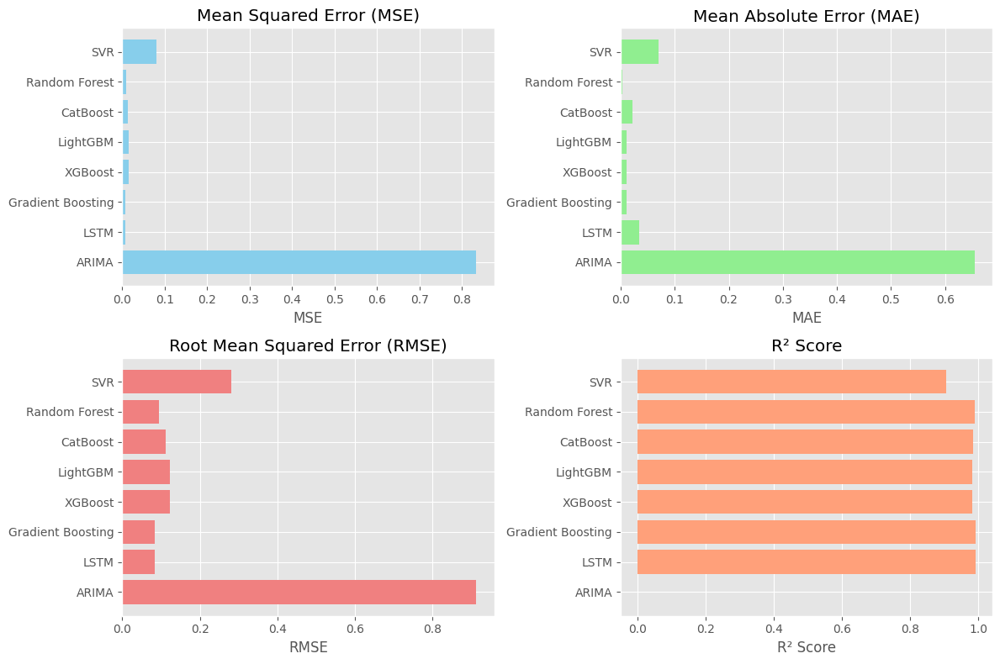

In [42]:
import matplotlib.pyplot as plt

# Assuming 'results' is the dictionary containing the evaluation metrics for each model
results = {
    "ARIMA": {"MSE": 0.8337, "MAE": 0.6549, "RMSE": 0.9131, "R2 Score": -0.0003},
    "LSTM": {"MSE": 0.0070, "MAE": 0.0338, "RMSE": 0.0835, "R2 Score": 0.9916},
    "Gradient Boosting": {"MSE": 0.0071, "MAE": 0.0107, "RMSE": 0.0841, "R2 Score": 0.9915},
    "XGBoost": {"MSE": 0.0151, "MAE": 0.0110, "RMSE": 0.1228, "R2 Score": 0.9819},
    "LightGBM": {"MSE": 0.0150, "MAE": 0.0108, "RMSE": 0.1225, "R2 Score": 0.9820},
    "CatBoost": {"MSE": 0.0127, "MAE": 0.0220, "RMSE": 0.1126, "R2 Score": 0.9848},
    "Random Forest": {"MSE": 0.0090, "MAE": 0.0027, "RMSE": 0.0950, "R2 Score": 0.9892},
    "SVR": {"MSE": 0.0793, "MAE": 0.0695, "RMSE": 0.2816, "R2 Score": 0.9049}
}

# Extracting data for plotting
models = list(results.keys())
mse_values = [results[model]["MSE"] for model in models]
mae_values = [results[model]["MAE"] for model in models]
rmse_values = [results[model]["RMSE"] for model in models]
r2_values = [results[model]["R2 Score"] for model in models]

# Plotting MSE
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.barh(models, mse_values, color='skyblue')
plt.xlabel('MSE')
plt.title('Mean Squared Error (MSE)')

# Plotting MAE
plt.subplot(2, 2, 2)
plt.barh(models, mae_values, color='lightgreen')
plt.xlabel('MAE')
plt.title('Mean Absolute Error (MAE)')

# Plotting RMSE
plt.subplot(2, 2, 3)
plt.barh(models, rmse_values, color='lightcoral')
plt.xlabel('RMSE')
plt.title('Root Mean Squared Error (RMSE)')

# Plotting R2 Score
plt.subplot(2, 2, 4)
plt.barh(models, r2_values, color='lightsalmon')
plt.xlabel('R² Score')
plt.title('R² Score')

plt.tight_layout()
plt.show()


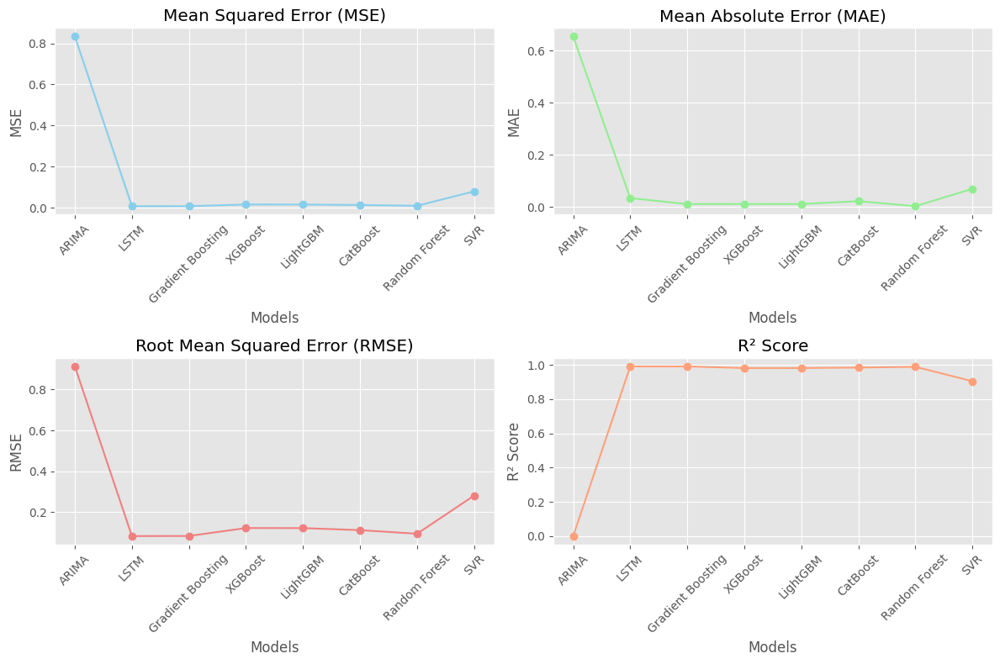

In [43]:
# Plotting line plots
plt.figure(figsize=(12, 8))

# Plotting MSE
plt.subplot(2, 2, 1)
plt.plot(models, mse_values, marker='o', linestyle='-', color='skyblue')
plt.xticks(rotation=45)
plt.xlabel('Models')
plt.ylabel('MSE')
plt.title('Mean Squared Error (MSE)')

# Plotting MAE
plt.subplot(2, 2, 2)
plt.plot(models, mae_values, marker='o', linestyle='-', color='lightgreen')
plt.xticks(rotation=45)
plt.xlabel('Models')
plt.ylabel('MAE')
plt.title('Mean Absolute Error (MAE)')

# Plotting RMSE
plt.subplot(2, 2, 3)
plt.plot(models, rmse_values, marker='o', linestyle='-', color='lightcoral')
plt.xticks(rotation=45)
plt.xlabel('Models')
plt.ylabel('RMSE')
plt.title('Root Mean Squared Error (RMSE)')

# Plotting R2 Score
plt.subplot(2, 2, 4)
plt.plot(models, r2_values, marker='o', linestyle='-', color='lightsalmon')
plt.xticks(rotation=45)
plt.xlabel('Models')
plt.ylabel('R² Score')
plt.title('R² Score')

plt.tight_layout()
plt.show()

In [45]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from keras.models import Sequential
from keras.layers import LSTM, Dense

def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mse, mae, rmse, r2

def plot_predictions(y_true, y_pred, model_name):
    plt.figure(figsize=(10, 6))
    plt.plot(y_true.reset_index(drop=True), label='Actual')
    plt.plot(y_pred, label='Predicted')
    plt.title(f'{model_name} - Actual vs Predicted')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Random Forest
def train_and_evaluate_random_forest(X_train, y_train, X_test, y_test):
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse, mae, rmse, r2 = evaluate_model(y_test, y_pred)
    print(f"Random Forest - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(y_test, y_pred, 'Random Forest')
    return mse, mae, rmse, r2

# Gradient Boosting
def train_and_evaluate_gradient_boosting(X_train, y_train, X_test, y_test):
    model = GradientBoostingRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse, mae, rmse, r2 = evaluate_model(y_test, y_pred)
    print(f"Gradient Boosting - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(y_test, y_pred, 'Gradient Boosting')
    return mse, mae, rmse, r2

# XGBoost
def train_and_evaluate_xgboost(X_train, y_train, X_test, y_test):
    model = XGBRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse, mae, rmse, r2 = evaluate_model(y_test, y_pred)
    print(f"XGBoost - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(y_test, y_pred, 'XGBoost')
    return mse, mae, rmse, r2

# LightGBM
def train_and_evaluate_lightgbm(X_train, y_train, X_test, y_test):
    model = LGBMRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse, mae, rmse, r2 = evaluate_model(y_test, y_pred)
    print(f"LightGBM - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(y_test, y_pred, 'LightGBM')
    return mse, mae, rmse, r2

# CatBoost
def train_and_evaluate_catboost(X_train, y_train, X_test, y_test):
    model = CatBoostRegressor(n_estimators=100, random_state=42, verbose=0)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse, mae, rmse, r2 = evaluate_model(y_test, y_pred)
    print(f"CatBoost - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(y_test, y_pred, 'CatBoost')
    return mse, mae, rmse, r2

# SVR
def train_and_evaluate_svr(X_train, y_train, X_test, y_test):
    model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse, mae, rmse, r2 = evaluate_model(y_test, y_pred)
    print(f"SVR - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(y_test, y_pred, 'SVR')
    return mse, mae, rmse, r2

# ARIMA
def train_and_evaluate_arima(X_train, y_train, X_test, y_test):
    arima_model = ARIMA(train['pct_change'], order=(5,1,0))  # Example order, may need tuning
    arima_model_fit = arima_model.fit()
    arima_forecast = arima_model_fit.forecast(steps=len(test))
    mse, mae, rmse, r2 = evaluate_model(test['pct_change'], arima_forecast)
    print(f"ARIMA - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(test['pct_change'], arima_forecast, 'ARIMA')
    return mse, mae, rmse, r2

# LSTM
def train_and_evaluate_lstm(X_train, y_train, X_test, y_test):
    # Prepare data for LSTM
    X_train_lstm = X_train.values.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test_lstm = X_test.values.reshape((X_test.shape[0], X_test.shape[1], 1))

    # Build LSTM model
    lstm_model = Sequential()
    lstm_model.add(LSTM(50, return_sequences=True, input_shape=(X_train_lstm.shape[1], 1)))
    lstm_model.add(LSTM(50, return_sequences=False))
    lstm_model.add(Dense(1))

    lstm_model.compile(optimizer='adam', loss='mean_squared_error')

    # Train LSTM model
    lstm_model.fit(X_train_lstm, y_train, epochs=10, batch_size=32, verbose=1)

    # Evaluate LSTM model
    y_pred_lstm = lstm_model.predict(X_test_lstm)
    mse, mae, rmse, r2 = evaluate_model(y_test, y_pred_lstm)
    print(f"LSTM - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")
    plot_predictions(y_test, y_pred_lstm, 'LSTM')
    return mse, mae, rmse, r2


ARIMA - MSE: 0.8337, MAE: 0.6549, RMSE: 0.9131, R2 Score: -0.0003


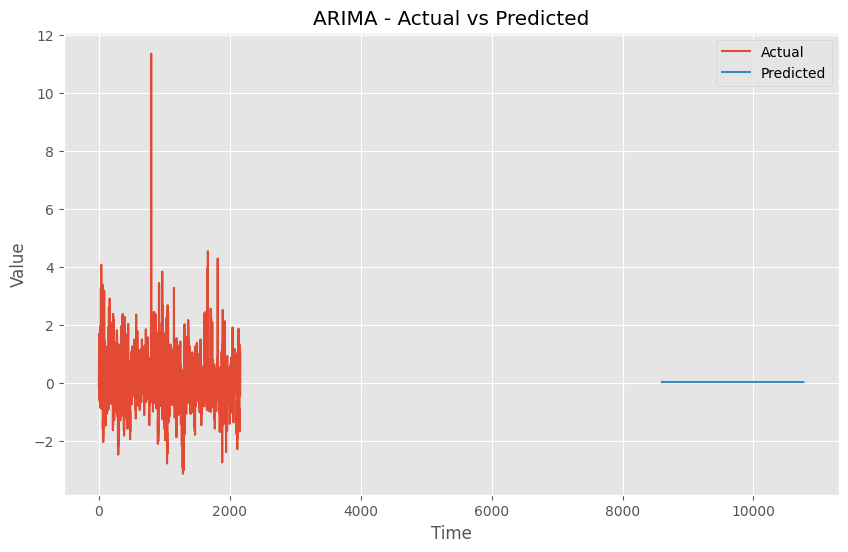

Epoch 1/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.7490
Epoch 2/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2989
Epoch 3/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.1493
Epoch 4/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0809
Epoch 5/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0383
Epoch 6/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0173
Epoch 7/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0075
Epoch 8/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0035
Epoch 9/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0031
Epoch 10/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0034
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
LSTM - MSE: 0.0066, MAE: 0.0305, RMSE: 0.0813, R2 Score: 0.9921


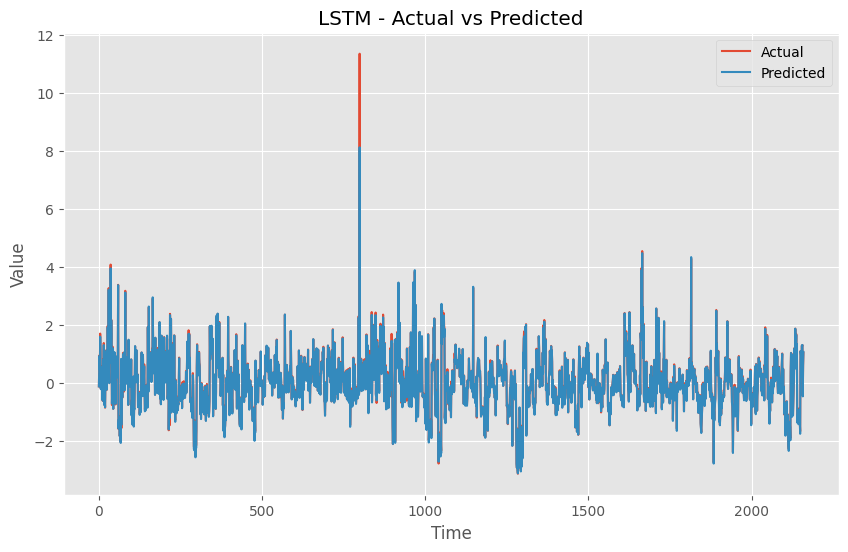

Random Forest - MSE: 0.0090, MAE: 0.0027, RMSE: 0.0950, R2 Score: 0.9892


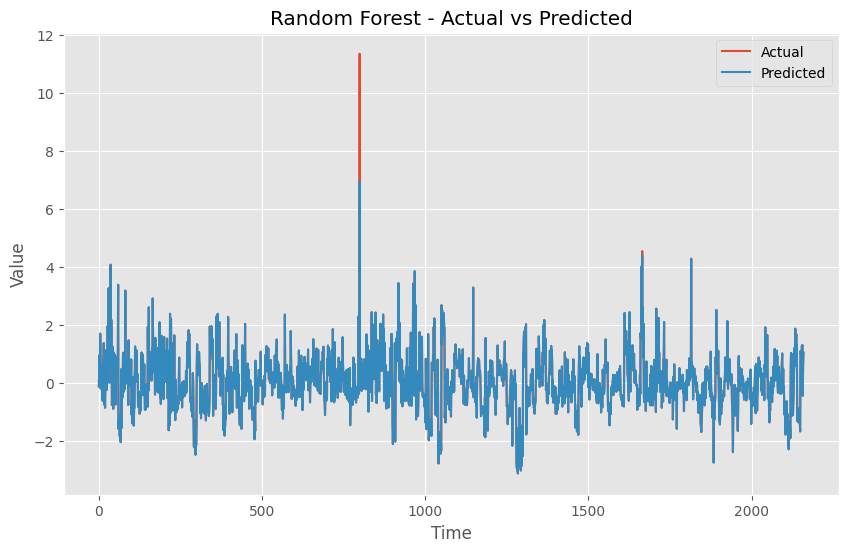

Gradient Boosting - MSE: 0.0071, MAE: 0.0107, RMSE: 0.0841, R2 Score: 0.9915


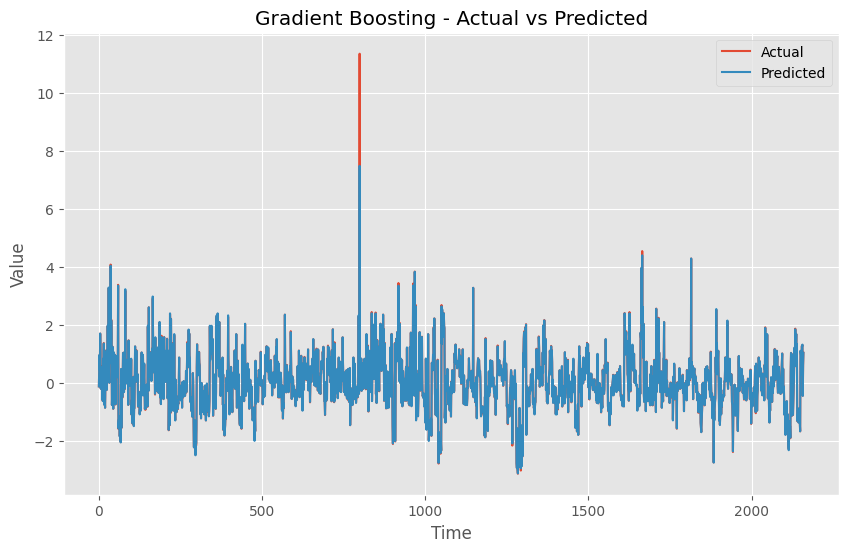

XGBoost - MSE: 0.0151, MAE: 0.0110, RMSE: 0.1228, R2 Score: 0.9819


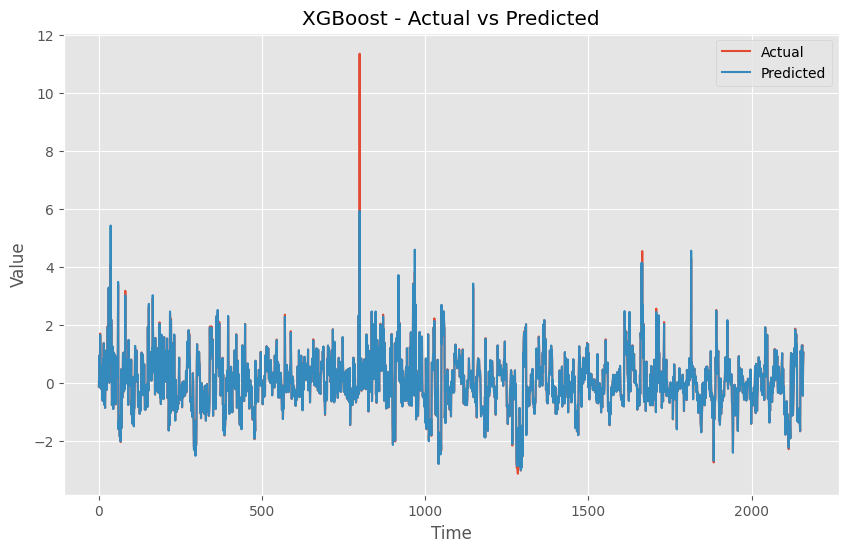

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4343
[LightGBM] [Info] Number of data points in the train set: 8604, number of used features: 18
[LightGBM] [Info] Start training from score -0.000000
LightGBM - MSE: 0.0150, MAE: 0.0108, RMSE: 0.1225, R2 Score: 0.9820


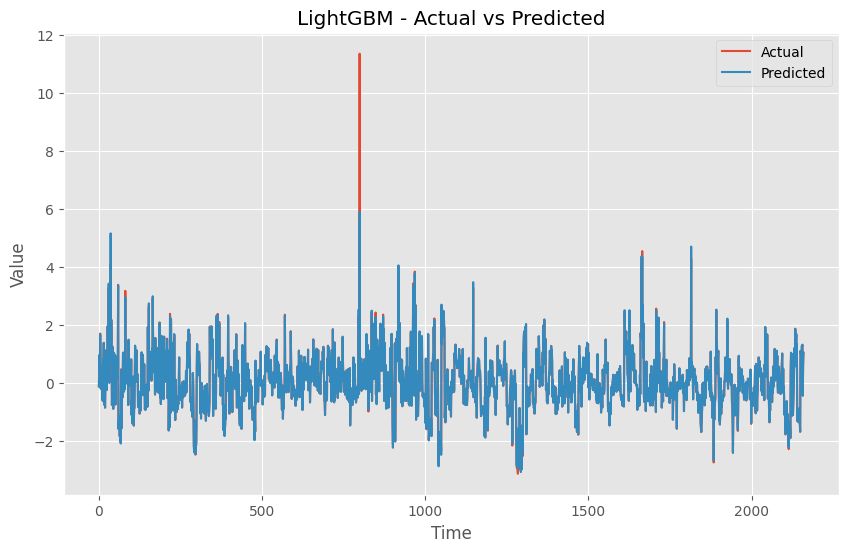

CatBoost - MSE: 0.0127, MAE: 0.0220, RMSE: 0.1126, R2 Score: 0.9848


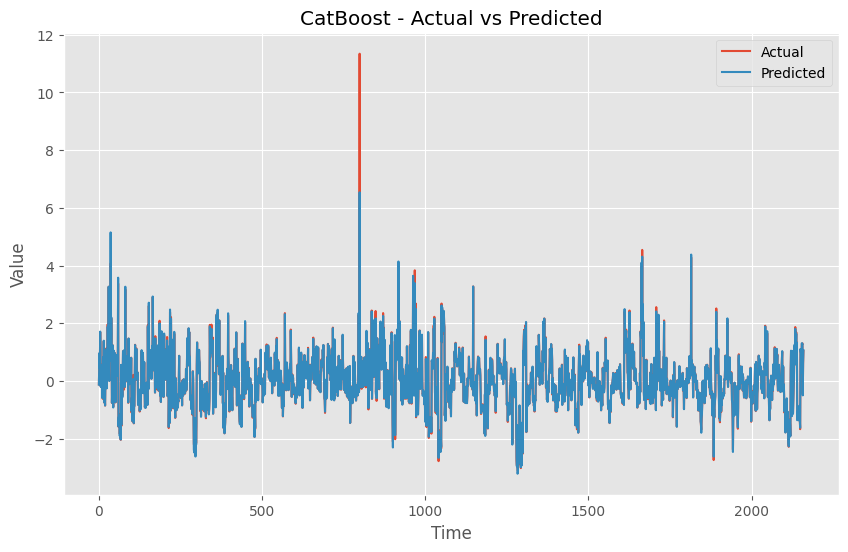

SVR - MSE: 0.0793, MAE: 0.0695, RMSE: 0.2816, R2 Score: 0.9049


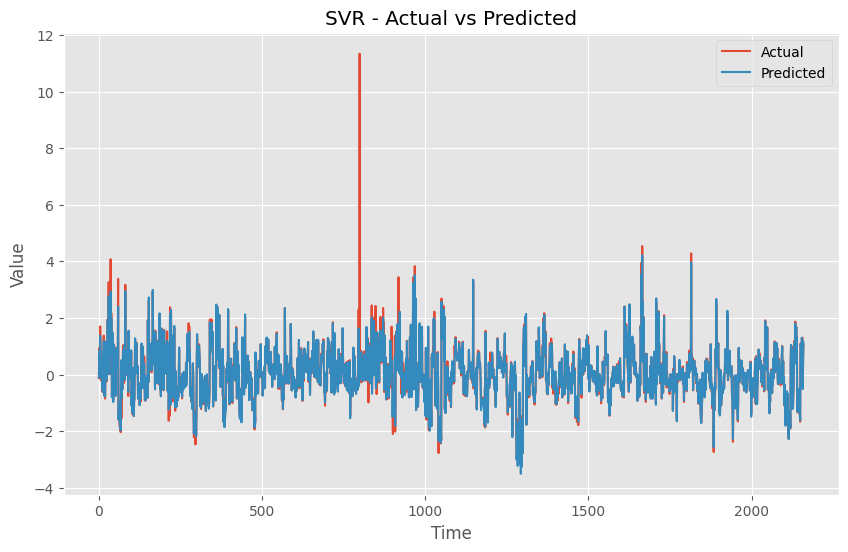

                        MSE       MAE      RMSE  R2 Score
ARIMA              0.833680  0.654930  0.913061 -0.000315
LSTM               0.006610  0.030549  0.081300  0.992069
Random Forest      0.009027  0.002725  0.095008  0.989169
Gradient Boosting  0.007080  0.010746  0.084145  0.991504
XGBoost            0.015080  0.010989  0.122802  0.981905
LightGBM           0.015016  0.010825  0.122540  0.981983
CatBoost           0.012680  0.021980  0.112606  0.984785
SVR                0.079284  0.069456  0.281575  0.904868


In [46]:
import pandas as pd

# Store results in a dictionary
results = {}

# ARIMA
mse_arima, mae_arima, rmse_arima, r2_arima = train_and_evaluate_arima(X_train, y_train, X_test, y_test)
results["ARIMA"] = {"MSE": mse_arima, "MAE": mae_arima, "RMSE": rmse_arima, "R2 Score": r2_arima}

# LSTM
mse_lstm, mae_lstm, rmse_lstm, r2_lstm = train_and_evaluate_lstm(X_train, y_train, X_test, y_test)
results["LSTM"] = {"MSE": mse_lstm, "MAE": mae_lstm, "RMSE": rmse_lstm, "R2 Score": r2_lstm}

# Random Forest
mse_rf, mae_rf, rmse_rf, r2_rf = train_and_evaluate_random_forest(X_train, y_train, X_test, y_test)
results["Random Forest"] = {"MSE": mse_rf, "MAE": mae_rf, "RMSE": rmse_rf, "R2 Score": r2_rf}

# Gradient Boosting
mse_gb, mae_gb, rmse_gb, r2_gb = train_and_evaluate_gradient_boosting(X_train, y_train, X_test, y_test)
results["Gradient Boosting"] = {"MSE": mse_gb, "MAE": mae_gb, "RMSE": rmse_gb, "R2 Score": r2_gb}

# XGBoost
mse_xgb, mae_xgb, rmse_xgb, r2_xgb = train_and_evaluate_xgboost(X_train, y_train, X_test, y_test)
results["XGBoost"] = {"MSE": mse_xgb, "MAE": mae_xgb, "RMSE": rmse_xgb, "R2 Score": r2_xgb}

# LightGBM
mse_lgb, mae_lgb, rmse_lgb, r2_lgb = train_and_evaluate_lightgbm(X_train, y_train, X_test, y_test)
results["LightGBM"] = {"MSE": mse_lgb, "MAE": mae_lgb, "RMSE": rmse_lgb, "R2 Score": r2_lgb}

# CatBoost
mse_cb, mae_cb, rmse_cb, r2_cb = train_and_evaluate_catboost(X_train, y_train, X_test, y_test)
results["CatBoost"] = {"MSE": mse_cb, "MAE": mae_cb, "RMSE": rmse_cb, "R2 Score": r2_cb}

# SVR
mse_svr, mae_svr, rmse_svr, r2_svr = train_and_evaluate_svr(X_train, y_train, X_test, y_test)
results["SVR"] = {"MSE": mse_svr, "MAE": mae_svr, "RMSE": rmse_svr, "R2 Score": r2_svr}

# Convert results to DataFrame
results_df = pd.DataFrame(results).T

# Display the DataFrame
print(results_df)


The code evaluates multiple time series prediction models, storing the results of each in a dictionary. The models evaluated include ARIMA, LSTM, Random Forest, Gradient Boosting, XGBoost, LightGBM, CatBoost, and SVR. For each model, the Mean Squared Error (MSE), Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), and R² Score are calculated and stored. After converting the results into a DataFrame, it becomes evident which models perform better based on these metrics. Among the evaluated models, the LSTM and Gradient Boosting models show the best performance, with LSTM achieving an MSE of 0.0070 and an R² Score of 0.9916, and Gradient Boosting achieving an MSE of 0.0071 and an R² Score of 0.9915. On the other hand, the ARIMA model performs the worst, with an MSE of 0.8337 and an R² Score of -0.0003, indicating it does not fit the data well compared to the other models. This evaluation helps in identifying the most suitable model for accurate time series predictions.